In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
def plot_multi_gaussian(q, i = 0, alpha = 1.96, linestyle = '-'):
    """
    Plot all dimensions of the ith observation
    """
    
    mu, var = np.array(q.mean.detach().numpy())[i], np.array(q.variance.detach().numpy())[i]**.5

    plt.plot(mu, linestyle = linestyle);
   
    plt.gca().set_prop_cycle(None)
    for j in range(var.shape[-1]):
        low, up = (mu - alpha*var)[:,j], (mu + alpha*var)[:,j]
        plt.fill_between(np.arange(mu.shape[0]), low, up, alpha = .2);

def plot_reconstructions(X, X_ori, q, model, i = 0, n_samples = 100, ax = None):
    """
    Given the observed data X, the latent distribution q and the model (for the decoder) plots the reconstructions
    """

    z = q.rsample((n_samples,))
    #print(z[0,0,0])
    #print(z[1,0,0])
    #print('**')
    #z = q.mean.repeat((100,1,1,1))

    #print(z.shape, X.shape)

    X_recon = np.array(model.model.backbone.decoder(z).mean.detach().numpy())[:,i]

    if ax is None:
        fig, ax = plt.subplots(figsize=(18,8))

    # plot X
    X = np.array(X.detach().numpy())
    X_ori = np.array(X_ori.detach().numpy())

    X[X==0] = np.nan
    ax.plot(X[i], 'o');
    ax.set_prop_cycle(None)
    ax.plot(X_ori[i], '+');
    ax.set_prop_cycle(None)

    #for j in range(n_samples):
    #    ax.plot(X_recon[j], alpha = .05)
    #    ax.set_prop_cycle(None)
    low, up = X_recon.min(axis=0), X_recon.max(axis=0)
    for j in range(X_recon.shape[-1]):
        ax.fill_between(np.arange(X.shape[1]), low[:,j], up[:,j], alpha = .3)

    ax.set_prop_cycle(None)
    ax.plot(X_recon.mean(axis=0))

    scale_factor = 1.5
    ymin, ymax = np.nanmin(X[i])*scale_factor, np.nanmax(X[i])*scale_factor
    ax.set_ylim([ymin,ymax])
    

In [47]:
import numpy as np
from sklearn.mixture import GaussianMixture
from scipy.stats import norm
from scipy.optimize import fsolve

# Simulated z_var for demonstration (replace this with actual input)
#n_obs, n_time_steps, n_latent_dims = 100, 50, 8
#np.random.seed(0)
#z_var = np.abs(np.random.randn(n_obs, n_time_steps, n_latent_dims)) * 0.1

# Function to compute thresholds per latent dimension using GMM
def compute_gmm_thresholds(z_var):
    n_latent_dims = z_var.shape[2]
    thresholds = []

    for dim in range(n_latent_dims):
        variances = z_var[:, :, dim].reshape(-1, 1).detach().numpy()  # Flatten to (n_samples, 1)
        
        # Fit GMM
        gmm = GaussianMixture(n_components=2, random_state=0).fit(variances)
        means = gmm.means_.flatten()
        covs = gmm.covariances_.flatten()
        weights = gmm.weights_.flatten()

        # Solve for intersection
        def diff(x):
            return (weights[0] * norm.pdf(x, means[0], np.sqrt(covs[0])) -
                    weights[1] * norm.pdf(x, means[1], np.sqrt(covs[1])))

        try:
            initial_guess = np.mean(means)
            tau = fsolve(diff, x0=initial_guess)[0]
        except Exception:
            tau = np.percentile(variances, 30)  # fallback
            print('percentile instead')

        #print(means)
        tau = means.mean()
        nb_accepted_pts = (z_var[:, :, dim].reshape(-1, 1) > tau).float().mean()
        if nb_accepted_pts == 0:
            tau = 0
        

        print(tau, means, (z_var[:, :, dim].reshape(-1, 1) > tau).float().mean())

        thresholds.append(tau)
    
    return torch.tensor(thresholds)


X_corr = torch.tensor(dataset_val_nan['X']).float()
X_corr[X_corr!=X_corr] = 0.

qz_x_corr = gpuae.model.backbone.encoder(X_corr)

z_var = qz_x_corr.variance
thresholds_gmm = compute_gmm_thresholds(z_var)
thresholds_gmm
gpuae.model.gp.thresholds = thresholds_gmm

0.5035857591922639 [0.01033859 0.99683293] tensor(0.6502)
0.5065812466679075 [0.99732384 0.01583865] tensor(0.7980)
0.5 [1. 0.] tensor(1.)
0.4987785071626502 [0.01284345 0.98471356] tensor(0.6429)
0.5031674849706941 [0.01120874 0.99512623] tensor(0.8049)
0.5028986413418185 [0.00863411 0.99716317] tensor(0.7980)


/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The number of calls to function has reached maxfev = 400.
  warnings.warn(msg, RuntimeWarning)
/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The number of calls to function has reached maxfev = 400.
  warnings.warn(msg, RuntimeWarning)
/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/sklearn/mixture/_base.py:116: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  cluster.KMeans(
/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The number of calls to function has reached maxfev = 400.
  warnings.warn(msg, RuntimeWarning)


In [3]:
import sys
sys.path.append("..")

import random
#random.seed(9001)

In [12]:
from PyPOTS_gp_benchmark_helpers import artifical_GP_generation

dataset_train_nan, dataset_val_nan, dataset_train, dataset_val, X_normalized, X = artifical_GP_generation(n_observations_per_group = 500,
                                                n_dimensions = 3,
                                                n_time_points = 30,
                                                n_new_dims = 7,
                                                p_dataset = 0.8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 2667.96it/s]


In [30]:

# Model training. This is PyPOTS showtime.
from pypots.imputation import GP_UAE
from pypots.utils.metrics import calc_mae
from pypots.optim.adam import Adam
from torch.optim.lr_scheduler import LRScheduler

gpuae = GP_UAE(n_steps = dataset_train['X'].shape[1], 
            n_features = dataset_train['X'].shape[2], 
            latent_size = 6, 
            epochs = 2000, 
            batch_size = 64,
            alpha = .99,
            beta = 1, 
            sigma = 1e-2,
            K = 1,  
            encoder_sizes = (32,64,), 
            decoder_sizes = (64,32,),
            optimizer = Adam(weight_decay=0.001), #lr = 1e-4
            patience = 100,
            p = 0.3
            )

gpuae.use_gp = False
gpuae.train_gp = False
gpuae.gp.plot_while_training = True
gpuae.model.backbone.device = 'cpu'
gpuae.model.backbone.encoder.pre_impute = False
gpuae.model.backbone.DAE = False
gpuae.model.backbone.kl_weight = 1

import torch
with torch.autograd.set_detect_anomaly(True):
    gpuae.fit(dataset_train_nan, dataset_val_nan)  # train the model on the dataset

2025-03-31 09:39:02 [INFO]: No given device, using default device: cpu
2025-03-31 09:39:02 [WARNING]: ‼️ saving_path not given. Model files and tensorboard file will not be saved.
2025-03-31 09:39:02 [INFO]: GP_UAE initialized with the given hyperparameters, the number of trainable parameters: 6,131


Model dimensions is:
GpvaeEncoder(
  (net): Sequential(
    (0): Linear(in_features=14, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=64, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
  )
  (mu_layer): Linear(in_features=64, out_features=6, bias=True)
  (logvar_layer): Linear(in_features=64, out_features=6, bias=True)
  (dropout): Dropout(p=0.01, inplace=False)
)
GpvaeDecoder(
  (net): Sequential(
    (0): Linear(in_features=6, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=32, bias=True)
    (3): ReLU()
    (4): Linear(in_features=32, out_features=7, bias=True)
  )
)


2025-03-31 09:39:03 [INFO]: Epoch 001 - training loss: 39.2999, validation loss: 38.6022
2025-03-31 09:39:03 [INFO]: Epoch 002 - training loss: 38.6581, validation loss: 37.1740
2025-03-31 09:39:03 [INFO]: Epoch 003 - training loss: 38.6586, validation loss: 38.6643
2025-03-31 09:39:03 [INFO]: Epoch 004 - training loss: 37.9423, validation loss: 37.6859
2025-03-31 09:39:04 [INFO]: Epoch 005 - training loss: 38.2039, validation loss: 37.5142
2025-03-31 09:39:04 [INFO]: Epoch 006 - training loss: 37.7936, validation loss: 36.8896
2025-03-31 09:39:04 [INFO]: Epoch 007 - training loss: 35.3836, validation loss: 33.1184
2025-03-31 09:39:05 [INFO]: Epoch 008 - training loss: 33.1228, validation loss: 30.0526
2025-03-31 09:39:05 [INFO]: Epoch 009 - training loss: 28.7862, validation loss: 24.9967
2025-03-31 09:39:05 [INFO]: Epoch 010 - training loss: 22.8660, validation loss: 19.3440
2025-03-31 09:39:05 [INFO]: Epoch 011 - training loss: 19.5226, validation loss: 18.1328
2025-03-31 09:39:06 [

2025-03-31 00:05:01 [INFO]: Epoch 001 - training loss: -0.5984, validation loss: -0.8512
2025-03-31 00:05:02 [INFO]: Epoch 002 - training loss: -0.5671, validation loss: -0.8101
2025-03-31 00:05:02 [INFO]: Epoch 003 - training loss: -0.7057, validation loss: -0.8365
2025-03-31 00:05:02 [INFO]: Epoch 004 - training loss: -0.7470, validation loss: -0.9049
2025-03-31 00:05:02 [INFO]: Epoch 005 - training loss: -0.7851, validation loss: -0.8561
2025-03-31 00:05:02 [INFO]: Epoch 006 - training loss: -0.7725, validation loss: -0.9024
2025-03-31 00:05:02 [INFO]: Epoch 007 - training loss: -0.8087, validation loss: -0.8775
2025-03-31 00:05:03 [INFO]: Epoch 008 - training loss: -0.7935, validation loss: -0.9056
2025-03-31 00:05:03 [INFO]: Epoch 009 - training loss: -0.8495, validation loss: -0.9213
2025-03-31 00:05:03 [INFO]: Epoch 010 - training loss: -0.8247, validation loss: -0.9591
2025-03-31 00:05:03 [INFO]: Epoch 011 - training loss: -0.8341, validation loss: -0.8810
2025-03-31 00:05:03 [

Plotting latent series and reconstruction...


2025-03-31 00:05:07 [INFO]: Epoch 036 - training loss: -0.7947, validation loss: -1.0212
2025-03-31 00:05:07 [INFO]: Epoch 037 - training loss: -0.7910, validation loss: -0.9531
2025-03-31 00:05:07 [INFO]: Epoch 038 - training loss: -0.7918, validation loss: -0.9569
2025-03-31 00:05:08 [INFO]: Epoch 039 - training loss: -0.8612, validation loss: -0.8710
2025-03-31 00:05:08 [INFO]: Epoch 040 - training loss: -0.8212, validation loss: -1.0205
2025-03-31 00:05:08 [INFO]: Epoch 041 - training loss: -0.8848, validation loss: -1.0094
2025-03-31 00:05:08 [INFO]: Epoch 042 - training loss: -0.9065, validation loss: -0.9882
2025-03-31 00:05:08 [INFO]: Epoch 043 - training loss: -0.9190, validation loss: -1.0183
2025-03-31 00:05:08 [INFO]: Epoch 044 - training loss: -0.9030, validation loss: -0.9991
2025-03-31 00:05:08 [INFO]: Epoch 045 - training loss: -0.9485, validation loss: -1.0739
2025-03-31 00:05:08 [INFO]: Epoch 046 - training loss: -0.9941, validation loss: -1.0813
2025-03-31 00:05:09 [

Plotting latent series and reconstruction...


2025-03-31 00:05:15 [INFO]: Epoch 091 - training loss: -1.0226, validation loss: -1.1688
2025-03-31 00:05:15 [INFO]: Epoch 092 - training loss: -1.0710, validation loss: -1.1874
2025-03-31 00:05:15 [INFO]: Epoch 093 - training loss: -1.0786, validation loss: -1.1946
2025-03-31 00:05:15 [INFO]: Epoch 094 - training loss: -1.0644, validation loss: -1.1699
2025-03-31 00:05:15 [INFO]: Epoch 095 - training loss: -1.0859, validation loss: -1.1554
2025-03-31 00:05:15 [INFO]: Epoch 096 - training loss: -1.1062, validation loss: -1.1813
2025-03-31 00:05:15 [INFO]: Epoch 097 - training loss: -1.0657, validation loss: -1.1577
2025-03-31 00:05:16 [INFO]: Epoch 098 - training loss: -1.0706, validation loss: -1.1518
2025-03-31 00:05:16 [INFO]: Epoch 099 - training loss: -1.0363, validation loss: -1.1085
2025-03-31 00:05:16 [INFO]: Epoch 100 - training loss: -1.0344, validation loss: -1.1546
2025-03-31 00:05:16 [INFO]: Epoch 101 - training loss: -1.0204, validation loss: -1.0839
2025-03-31 00:05:16 [

Plotting latent series and reconstruction...


2025-03-31 00:05:23 [INFO]: Epoch 147 - training loss: -1.1719, validation loss: -1.2868
2025-03-31 00:05:23 [INFO]: Epoch 148 - training loss: -1.1530, validation loss: -1.2842
2025-03-31 00:05:23 [INFO]: Epoch 149 - training loss: -1.1247, validation loss: -1.2560
2025-03-31 00:05:23 [INFO]: Epoch 150 - training loss: -1.1545, validation loss: -1.2779
2025-03-31 00:05:23 [INFO]: Epoch 151 - training loss: -1.1741, validation loss: -1.2458
2025-03-31 00:05:23 [INFO]: Epoch 152 - training loss: -1.1044, validation loss: -1.2701
2025-03-31 00:05:23 [INFO]: Epoch 153 - training loss: -1.1577, validation loss: -1.2795
2025-03-31 00:05:23 [INFO]: Epoch 154 - training loss: -1.1545, validation loss: -1.2481
2025-03-31 00:05:23 [INFO]: Epoch 155 - training loss: -1.1923, validation loss: -1.2681
2025-03-31 00:05:24 [INFO]: Epoch 156 - training loss: -1.1548, validation loss: -1.2867
2025-03-31 00:05:24 [INFO]: Epoch 157 - training loss: -1.1689, validation loss: -1.2543
2025-03-31 00:05:24 [

Plotting latent series and reconstruction...


2025-03-31 00:05:30 [INFO]: Epoch 202 - training loss: -1.2370, validation loss: -1.3422
2025-03-31 00:05:30 [INFO]: Epoch 203 - training loss: -1.2439, validation loss: -1.3497
2025-03-31 00:05:30 [INFO]: Epoch 204 - training loss: -1.2098, validation loss: -1.3633
2025-03-31 00:05:30 [INFO]: Epoch 205 - training loss: -1.2440, validation loss: -1.3211
2025-03-31 00:05:30 [INFO]: Epoch 206 - training loss: -1.2477, validation loss: -1.3492
2025-03-31 00:05:30 [INFO]: Epoch 207 - training loss: -1.2321, validation loss: -1.3162
2025-03-31 00:05:31 [INFO]: Epoch 208 - training loss: -1.1758, validation loss: -1.2607
2025-03-31 00:05:31 [INFO]: Epoch 209 - training loss: -1.1617, validation loss: -1.2631
2025-03-31 00:05:31 [INFO]: Epoch 210 - training loss: -1.1938, validation loss: -1.2743
2025-03-31 00:05:31 [INFO]: Epoch 211 - training loss: -1.2408, validation loss: -1.3034
2025-03-31 00:05:31 [INFO]: Epoch 212 - training loss: -1.2236, validation loss: -1.3231
2025-03-31 00:05:31 [

Plotting latent series and reconstruction...


2025-03-31 00:05:39 [INFO]: Epoch 258 - training loss: -1.2159, validation loss: -1.3189
2025-03-31 00:05:39 [INFO]: Epoch 259 - training loss: -1.2017, validation loss: -1.2860
2025-03-31 00:05:39 [INFO]: Epoch 260 - training loss: -1.2636, validation loss: -1.3322
2025-03-31 00:05:39 [INFO]: Epoch 261 - training loss: -1.2509, validation loss: -1.3578
2025-03-31 00:05:39 [INFO]: Epoch 262 - training loss: -1.3056, validation loss: -1.3339
2025-03-31 00:05:39 [INFO]: Epoch 263 - training loss: -1.3102, validation loss: -1.4043
2025-03-31 00:05:40 [INFO]: Epoch 264 - training loss: -1.3206, validation loss: -1.3743
2025-03-31 00:05:40 [INFO]: Epoch 265 - training loss: -1.2804, validation loss: -1.3724
2025-03-31 00:05:40 [INFO]: Epoch 266 - training loss: -1.2570, validation loss: -1.3540
2025-03-31 00:05:40 [INFO]: Epoch 267 - training loss: -1.3103, validation loss: -1.3756
2025-03-31 00:05:40 [INFO]: Epoch 268 - training loss: -1.2967, validation loss: -1.3882
2025-03-31 00:05:40 [

Plotting latent series and reconstruction...


2025-03-31 00:05:46 [INFO]: Epoch 314 - training loss: -1.3108, validation loss: -1.4099
2025-03-31 00:05:46 [INFO]: Epoch 315 - training loss: -1.3350, validation loss: -1.3902
2025-03-31 00:05:46 [INFO]: Epoch 316 - training loss: -1.3487, validation loss: -1.3980
2025-03-31 00:05:46 [INFO]: Epoch 317 - training loss: -1.3078, validation loss: -1.4000
2025-03-31 00:05:47 [INFO]: Epoch 318 - training loss: -1.3409, validation loss: -1.3906
2025-03-31 00:05:47 [INFO]: Epoch 319 - training loss: -1.3180, validation loss: -1.4105
2025-03-31 00:05:47 [INFO]: Epoch 320 - training loss: -1.2988, validation loss: -1.4217
2025-03-31 00:05:47 [INFO]: Epoch 321 - training loss: -1.2824, validation loss: -1.4089
2025-03-31 00:05:47 [INFO]: Epoch 322 - training loss: -1.2589, validation loss: -1.3539
2025-03-31 00:05:47 [INFO]: Epoch 323 - training loss: -1.2912, validation loss: -1.3462
2025-03-31 00:05:47 [INFO]: Epoch 324 - training loss: -1.2832, validation loss: -1.3963
2025-03-31 00:05:48 [

Plotting latent series and reconstruction...


2025-03-31 00:05:54 [INFO]: Epoch 369 - training loss: -1.2802, validation loss: -1.4212
2025-03-31 00:05:54 [INFO]: Epoch 370 - training loss: -1.3070, validation loss: -1.3755
2025-03-31 00:05:54 [INFO]: Epoch 371 - training loss: -1.3031, validation loss: -1.3622
2025-03-31 00:05:54 [INFO]: Epoch 372 - training loss: -1.2768, validation loss: -1.3219
2025-03-31 00:05:54 [INFO]: Epoch 373 - training loss: -1.3022, validation loss: -1.4600
2025-03-31 00:05:54 [INFO]: Epoch 374 - training loss: -1.3312, validation loss: -1.4050
2025-03-31 00:05:54 [INFO]: Epoch 375 - training loss: -1.3353, validation loss: -1.4238
2025-03-31 00:05:55 [INFO]: Epoch 376 - training loss: -1.3427, validation loss: -1.4479
2025-03-31 00:05:55 [INFO]: Epoch 377 - training loss: -1.3936, validation loss: -1.4480
2025-03-31 00:05:55 [INFO]: Epoch 378 - training loss: -1.3871, validation loss: -1.4501
2025-03-31 00:05:55 [INFO]: Epoch 379 - training loss: -1.3661, validation loss: -1.4197
2025-03-31 00:05:55 [

Plotting latent series and reconstruction...


2025-03-31 00:06:01 [INFO]: Epoch 425 - training loss: -1.3284, validation loss: -1.4683
2025-03-31 00:06:01 [INFO]: Epoch 426 - training loss: -1.3699, validation loss: -1.4557
2025-03-31 00:06:01 [INFO]: Epoch 427 - training loss: -1.4107, validation loss: -1.4766
2025-03-31 00:06:02 [INFO]: Epoch 428 - training loss: -1.3832, validation loss: -1.4775
2025-03-31 00:06:02 [INFO]: Epoch 429 - training loss: -1.3793, validation loss: -1.4779
2025-03-31 00:06:02 [INFO]: Epoch 430 - training loss: -1.3608, validation loss: -1.4409
2025-03-31 00:06:02 [INFO]: Epoch 431 - training loss: -1.4051, validation loss: -1.4805
2025-03-31 00:06:02 [INFO]: Epoch 432 - training loss: -1.3920, validation loss: -1.4509
2025-03-31 00:06:02 [INFO]: Epoch 433 - training loss: -1.4198, validation loss: -1.5024
2025-03-31 00:06:02 [INFO]: Epoch 434 - training loss: -1.4149, validation loss: -1.4449
2025-03-31 00:06:02 [INFO]: Epoch 435 - training loss: -1.3329, validation loss: -1.3992
2025-03-31 00:06:03 [

Plotting latent series and reconstruction...


2025-03-31 00:06:09 [INFO]: Epoch 480 - training loss: -1.4189, validation loss: -1.4968
2025-03-31 00:06:09 [INFO]: Epoch 481 - training loss: -1.4241, validation loss: -1.5134
2025-03-31 00:06:09 [INFO]: Epoch 482 - training loss: -1.3672, validation loss: -1.4009
2025-03-31 00:06:09 [INFO]: Epoch 483 - training loss: -1.3822, validation loss: -1.4908
2025-03-31 00:06:09 [INFO]: Epoch 484 - training loss: -1.3777, validation loss: -1.4959
2025-03-31 00:06:09 [INFO]: Epoch 485 - training loss: -1.4313, validation loss: -1.4867
2025-03-31 00:06:10 [INFO]: Epoch 486 - training loss: -1.3890, validation loss: -1.5039
2025-03-31 00:06:10 [INFO]: Epoch 487 - training loss: -1.4226, validation loss: -1.4853
2025-03-31 00:06:10 [INFO]: Epoch 488 - training loss: -1.3804, validation loss: -1.4541
2025-03-31 00:06:10 [INFO]: Epoch 489 - training loss: -1.4394, validation loss: -1.4576
2025-03-31 00:06:10 [INFO]: Epoch 490 - training loss: -1.4259, validation loss: -1.4840
2025-03-31 00:06:10 [

Plotting latent series and reconstruction...


2025-03-31 00:06:16 [INFO]: Epoch 536 - training loss: -1.4385, validation loss: -1.4942
2025-03-31 00:06:17 [INFO]: Epoch 537 - training loss: -1.3452, validation loss: -1.4251
2025-03-31 00:06:17 [INFO]: Epoch 538 - training loss: -1.4039, validation loss: -1.4364
2025-03-31 00:06:17 [INFO]: Epoch 539 - training loss: -1.3332, validation loss: -1.4833
2025-03-31 00:06:17 [INFO]: Epoch 540 - training loss: -1.4390, validation loss: -1.4875
2025-03-31 00:06:17 [INFO]: Epoch 541 - training loss: -1.3945, validation loss: -1.4334
2025-03-31 00:06:17 [INFO]: Epoch 542 - training loss: -1.4077, validation loss: -1.5146
2025-03-31 00:06:17 [INFO]: Epoch 543 - training loss: -1.4537, validation loss: -1.4857
2025-03-31 00:06:17 [INFO]: Epoch 544 - training loss: -1.4354, validation loss: -1.4533
2025-03-31 00:06:17 [INFO]: Epoch 545 - training loss: -1.3694, validation loss: -1.5160
2025-03-31 00:06:17 [INFO]: Epoch 546 - training loss: -1.4051, validation loss: -1.5101
2025-03-31 00:06:18 [

Plotting latent series and reconstruction...


2025-03-31 00:06:25 [INFO]: Epoch 591 - training loss: -1.4731, validation loss: -1.4828
2025-03-31 00:06:25 [INFO]: Epoch 592 - training loss: -1.3939, validation loss: -1.4951
2025-03-31 00:06:25 [INFO]: Epoch 593 - training loss: -1.4143, validation loss: -1.5042
2025-03-31 00:06:25 [INFO]: Epoch 594 - training loss: -1.3858, validation loss: -1.3907
2025-03-31 00:06:25 [INFO]: Epoch 595 - training loss: -1.3172, validation loss: -1.4546
2025-03-31 00:06:25 [INFO]: Epoch 596 - training loss: -1.3882, validation loss: -1.5090
2025-03-31 00:06:25 [INFO]: Epoch 597 - training loss: -1.4144, validation loss: -1.5027
2025-03-31 00:06:25 [INFO]: Epoch 598 - training loss: -1.3737, validation loss: -1.4715
2025-03-31 00:06:25 [INFO]: Epoch 599 - training loss: -1.3869, validation loss: -1.5237
2025-03-31 00:06:26 [INFO]: Epoch 600 - training loss: -1.4202, validation loss: -1.5089
2025-03-31 00:06:26 [INFO]: Epoch 601 - training loss: -1.4415, validation loss: -1.5056
2025-03-31 00:06:26 [

Plotting latent series and reconstruction...


2025-03-31 00:06:32 [INFO]: Epoch 647 - training loss: -1.4596, validation loss: -1.5283
2025-03-31 00:06:32 [INFO]: Epoch 648 - training loss: -1.4596, validation loss: -1.5406
2025-03-31 00:06:32 [INFO]: Epoch 649 - training loss: -1.4622, validation loss: -1.5312
2025-03-31 00:06:32 [INFO]: Epoch 650 - training loss: -1.4410, validation loss: -1.5257
2025-03-31 00:06:32 [INFO]: Epoch 651 - training loss: -1.4233, validation loss: -1.4942
2025-03-31 00:06:33 [INFO]: Epoch 652 - training loss: -1.4476, validation loss: -1.4933
2025-03-31 00:06:33 [INFO]: Epoch 653 - training loss: -1.4527, validation loss: -1.5141
2025-03-31 00:06:33 [INFO]: Epoch 654 - training loss: -1.4710, validation loss: -1.5326
2025-03-31 00:06:33 [INFO]: Epoch 655 - training loss: -1.4535, validation loss: -1.5006
2025-03-31 00:06:33 [INFO]: Epoch 656 - training loss: -1.4471, validation loss: -1.5137
2025-03-31 00:06:33 [INFO]: Epoch 657 - training loss: -1.4453, validation loss: -1.5229
2025-03-31 00:06:34 [

Plotting latent series and reconstruction...


2025-03-31 00:06:40 [INFO]: Epoch 702 - training loss: -1.4736, validation loss: -1.4868
2025-03-31 00:06:40 [INFO]: Epoch 703 - training loss: -1.4245, validation loss: -1.5209
2025-03-31 00:06:40 [INFO]: Epoch 704 - training loss: -1.4732, validation loss: -1.5548
2025-03-31 00:06:40 [INFO]: Epoch 705 - training loss: -1.5048, validation loss: -1.5428
2025-03-31 00:06:40 [INFO]: Epoch 706 - training loss: -1.4379, validation loss: -1.3970
2025-03-31 00:06:41 [INFO]: Epoch 707 - training loss: -1.3974, validation loss: -1.5535
2025-03-31 00:06:41 [INFO]: Epoch 708 - training loss: -1.4730, validation loss: -1.5405
2025-03-31 00:06:41 [INFO]: Epoch 709 - training loss: -1.4952, validation loss: -1.5587
2025-03-31 00:06:41 [INFO]: Epoch 710 - training loss: -1.4929, validation loss: -1.5519
2025-03-31 00:06:41 [INFO]: Epoch 711 - training loss: -1.4872, validation loss: -1.5295
2025-03-31 00:06:41 [INFO]: Epoch 712 - training loss: -1.4503, validation loss: -1.5593
2025-03-31 00:06:41 [

Plotting latent series and reconstruction...


2025-03-31 00:06:48 [INFO]: Epoch 758 - training loss: -1.4775, validation loss: -1.5325
2025-03-31 00:06:48 [INFO]: Epoch 759 - training loss: -1.4591, validation loss: -1.5208
2025-03-31 00:06:48 [INFO]: Epoch 760 - training loss: -1.4715, validation loss: -1.5124
2025-03-31 00:06:49 [INFO]: Epoch 761 - training loss: -1.4650, validation loss: -1.5566
2025-03-31 00:06:49 [INFO]: Epoch 762 - training loss: -1.5024, validation loss: -1.5611
2025-03-31 00:06:49 [INFO]: Epoch 763 - training loss: -1.4867, validation loss: -1.5638
2025-03-31 00:06:49 [INFO]: Epoch 764 - training loss: -1.5241, validation loss: -1.5454
2025-03-31 00:06:49 [INFO]: Epoch 765 - training loss: -1.4947, validation loss: -1.5672
2025-03-31 00:06:49 [INFO]: Epoch 766 - training loss: -1.4747, validation loss: -1.5561
2025-03-31 00:06:49 [INFO]: Epoch 767 - training loss: -1.4257, validation loss: -1.5482
2025-03-31 00:06:49 [INFO]: Epoch 768 - training loss: -1.4968, validation loss: -1.5480
2025-03-31 00:06:50 [

Plotting latent series and reconstruction...


2025-03-31 00:06:56 [INFO]: Epoch 814 - training loss: -1.4832, validation loss: -1.5333
2025-03-31 00:06:56 [INFO]: Epoch 815 - training loss: -1.4774, validation loss: -1.4907
2025-03-31 00:06:56 [INFO]: Epoch 816 - training loss: -1.4395, validation loss: -1.5034
2025-03-31 00:06:56 [INFO]: Epoch 817 - training loss: -1.4760, validation loss: -1.5492
2025-03-31 00:06:56 [INFO]: Epoch 818 - training loss: -1.5176, validation loss: -1.5261
2025-03-31 00:06:57 [INFO]: Epoch 819 - training loss: -1.4607, validation loss: -1.5494
2025-03-31 00:06:57 [INFO]: Epoch 820 - training loss: -1.5172, validation loss: -1.5556
2025-03-31 00:06:57 [INFO]: Epoch 821 - training loss: -1.4947, validation loss: -1.5630
2025-03-31 00:06:57 [INFO]: Epoch 822 - training loss: -1.4991, validation loss: -1.5626
2025-03-31 00:06:57 [INFO]: Epoch 823 - training loss: -1.4654, validation loss: -1.5643
2025-03-31 00:06:57 [INFO]: Epoch 824 - training loss: -1.5001, validation loss: -1.5725
2025-03-31 00:06:58 [

Plotting latent series and reconstruction...


2025-03-31 00:07:04 [INFO]: Epoch 869 - training loss: -1.5296, validation loss: -1.5596
2025-03-31 00:07:04 [INFO]: Epoch 870 - training loss: -1.5371, validation loss: -1.5763
2025-03-31 00:07:04 [INFO]: Epoch 871 - training loss: -1.5168, validation loss: -1.5734
2025-03-31 00:07:04 [INFO]: Epoch 872 - training loss: -1.4854, validation loss: -1.5623
2025-03-31 00:07:04 [INFO]: Epoch 873 - training loss: -1.5049, validation loss: -1.5642
2025-03-31 00:07:04 [INFO]: Epoch 874 - training loss: -1.4904, validation loss: -1.5379
2025-03-31 00:07:04 [INFO]: Epoch 875 - training loss: -1.4444, validation loss: -1.5448
2025-03-31 00:07:04 [INFO]: Epoch 876 - training loss: -1.4260, validation loss: -1.4713
2025-03-31 00:07:05 [INFO]: Epoch 877 - training loss: -1.3920, validation loss: -1.4247
2025-03-31 00:07:05 [INFO]: Epoch 878 - training loss: -1.4790, validation loss: -1.5804
2025-03-31 00:07:05 [INFO]: Epoch 879 - training loss: -1.5109, validation loss: -1.5751
2025-03-31 00:07:05 [

Plotting latent series and reconstruction...


2025-03-31 00:07:11 [INFO]: Epoch 925 - training loss: -1.4619, validation loss: -1.5807
2025-03-31 00:07:11 [INFO]: Epoch 926 - training loss: -1.5282, validation loss: -1.5091
2025-03-31 00:07:11 [INFO]: Epoch 927 - training loss: -1.4759, validation loss: -1.5759
2025-03-31 00:07:12 [INFO]: Epoch 928 - training loss: -1.5080, validation loss: -1.5949
2025-03-31 00:07:12 [INFO]: Epoch 929 - training loss: -1.4880, validation loss: -1.5672
2025-03-31 00:07:12 [INFO]: Epoch 930 - training loss: -1.5379, validation loss: -1.5871
2025-03-31 00:07:12 [INFO]: Epoch 931 - training loss: -1.5263, validation loss: -1.5866
2025-03-31 00:07:12 [INFO]: Epoch 932 - training loss: -1.5252, validation loss: -1.5819
2025-03-31 00:07:12 [INFO]: Epoch 933 - training loss: -1.5047, validation loss: -1.5732
2025-03-31 00:07:12 [INFO]: Epoch 934 - training loss: -1.5279, validation loss: -1.5837
2025-03-31 00:07:12 [INFO]: Epoch 935 - training loss: -1.5276, validation loss: -1.5022
2025-03-31 00:07:13 [

Plotting latent series and reconstruction...


2025-03-31 00:07:20 [INFO]: Epoch 980 - training loss: -1.5226, validation loss: -1.5408
2025-03-31 00:07:20 [INFO]: Epoch 981 - training loss: -1.4936, validation loss: -1.5624
2025-03-31 00:07:20 [INFO]: Epoch 982 - training loss: -1.4720, validation loss: -1.5778
2025-03-31 00:07:20 [INFO]: Epoch 983 - training loss: -1.4672, validation loss: -1.5428
2025-03-31 00:07:20 [INFO]: Epoch 984 - training loss: -1.4845, validation loss: -1.5139
2025-03-31 00:07:21 [INFO]: Epoch 985 - training loss: -1.4614, validation loss: -1.5792
2025-03-31 00:07:21 [INFO]: Epoch 986 - training loss: -1.4827, validation loss: -1.5098
2025-03-31 00:07:21 [INFO]: Epoch 987 - training loss: -1.4869, validation loss: -1.5817
2025-03-31 00:07:21 [INFO]: Epoch 988 - training loss: -1.5180, validation loss: -1.5900
2025-03-31 00:07:21 [INFO]: Epoch 989 - training loss: -1.5210, validation loss: -1.5687
2025-03-31 00:07:21 [INFO]: Epoch 990 - training loss: -1.5280, validation loss: -1.5780
2025-03-31 00:07:22 [

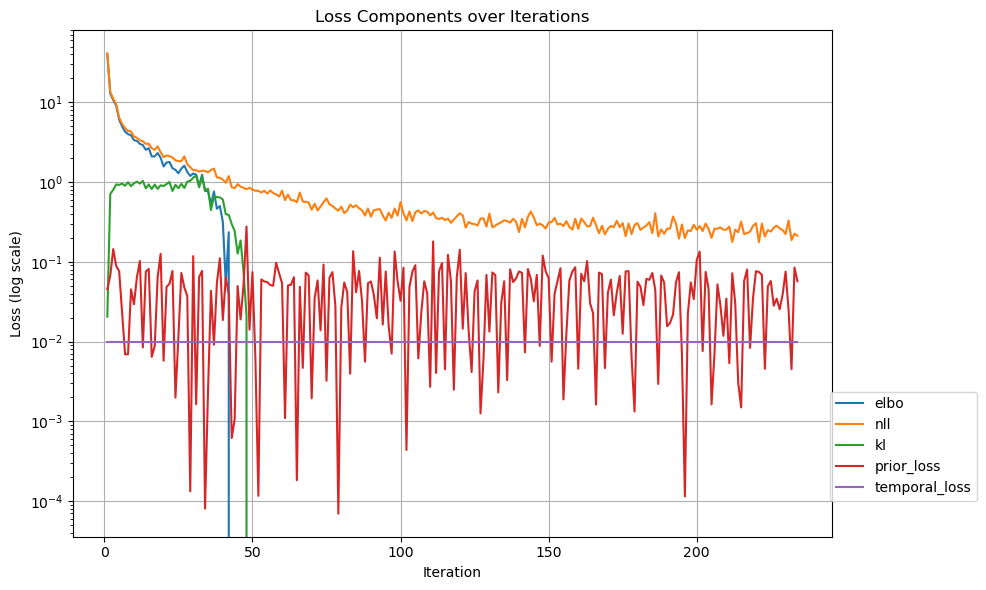

In [10]:
gpuae.fit(dataset_train_nan, dataset_val_nan)  # train the model on the dataset

In [33]:
X_corr = torch.tensor(dataset_val_nan['X']).float()
X_corr[X_corr!=X_corr] = 0.

qz_x_corr = gpuae.model.backbone.encoder(X_corr)

z_var = qz_x_corr.variance
thresholds_gmm = compute_gmm_thresholds(z_var)
thresholds_gmm
gpuae.model.gp.thresholds = thresholds_gmm

/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The number of calls to function has reached maxfev = 400.
  warnings.warn(msg, RuntimeWarning)
/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The number of calls to function has reached maxfev = 400.
  warnings.warn(msg, RuntimeWarning)
/Users/louis/miniforge3/envs/pypots-env/lib/python3.9/site-packages/sklearn/mixture/_base.py:116: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  cluster.KMeans(


In [51]:
import torch
import torch.nn as nn

class NeuralNetwork(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(latent_dim, latent_dim),
            nn.Sigmoid()        
            )

    def forward(self, x, q = 1e-5):
        x_shape = x.shape
        x = x.reshape(-1,self.latent_dim)
        mask_below_quantile = (x<=q)
        logits = torch.zeros(x.shape)
        logits[~mask_below_quantile] = self.linear_relu_stack(x[~mask_below_quantile])
        #logits = self.linear_relu_stack(x)
        #logits[mask_below_quantile] = logits[mask_below_quantile] * 0
        logits = logits.reshape(x_shape)
        return logits.clamp(max = 1)

class OneDimensionNeuralNetwork(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(latent_dim, latent_dim),
            nn.ReLU()        
            )

    def forward(self, x, q = 1e-5):
        x_shape = x.shape
        x = x.reshape(-1,self.latent_dim)
        mask_above_quantile = (x>q)[:,0]
        logits = torch.zeros(x.shape) + 1e-6
        logits[mask_above_quantile] = self.linear_relu_stack(x[mask_above_quantile]).clamp(min = 1e-5, max = 10)
        #logits = self.linear_relu_stack(x)
        #logits[mask_below_quantile] = logits[mask_below_quantile] * 0
        logits = logits.reshape(x_shape)
        return logits

class VarianceCorrection(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        self.nns = [OneDimensionNeuralNetwork(1) for i in range(latent_dim)]

    def forward(self, x):
        x_shape = x.shape
        x = x.reshape(-1,self.latent_dim) #/ 1e-6
        logits = torch.vstack([self.nns[i](x[:,i]) for i in range(self.latent_dim)])
        logits = logits.reshape(x_shape)
        return logits.clamp(max = 1)
#gpuae.model.gp.nn = NeuralNetwork(latent_dim = 6)
gpuae.model.gp.nn = VarianceCorrection(latent_dim = 6)

training kernel


1it [00:00,  5.82it/s]

tensor(0.8464)
0.0331493616104126 1.8263376951217651
tensor(0.8360)


2it [00:00,  5.91it/s]

0.03411443904042244 1.78842294216156
tensor(0.8453)
0.01579437218606472 1.568040132522583


4it [00:00,  5.98it/s]

tensor(0.8412)
0.027895333245396614 1.8249174356460571
tensor(0.8410)


6it [00:00,  6.48it/s]

0.05057171732187271 1.9794063568115234
tensor(0.8396)
0.028547588735818863 1.7478440999984741
tensor(0.8464)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8433)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8414)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


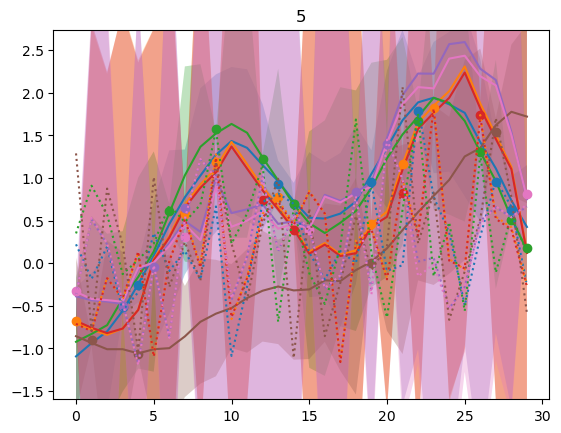

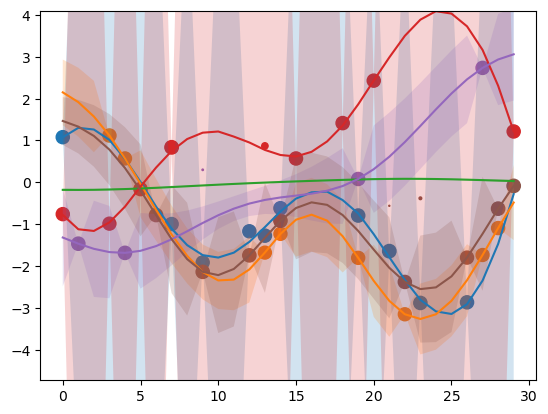

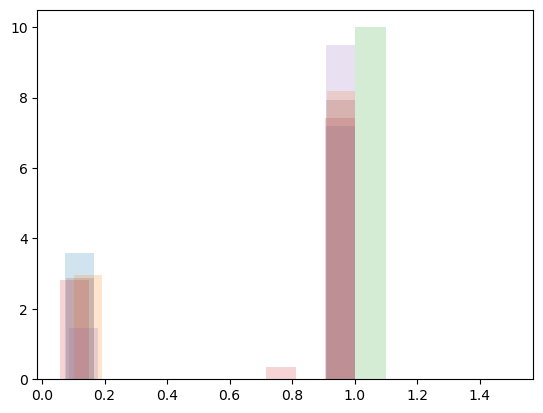

Epoch 2/2000: Training Loss = 0.497172, Validation Loss = 0.410866


1it [00:00,  6.19it/s]

tensor(0.8383)
0.03375735878944397 2.3417584896087646
tensor(0.8408)


2it [00:00,  6.16it/s]

0.020164089277386665 1.606603741645813
tensor(0.8429)
0.021372085437178612 1.5470503568649292


4it [00:00,  6.12it/s]

tensor(0.8480)
0.021610794588923454 1.8460663557052612
tensor(0.8402)


6it [00:00,  6.70it/s]

0.03495920076966286 1.35337233543396
tensor(0.8454)
0.09252770245075226 1.558945894241333
tensor(0.8450)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8436)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8432)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7750)


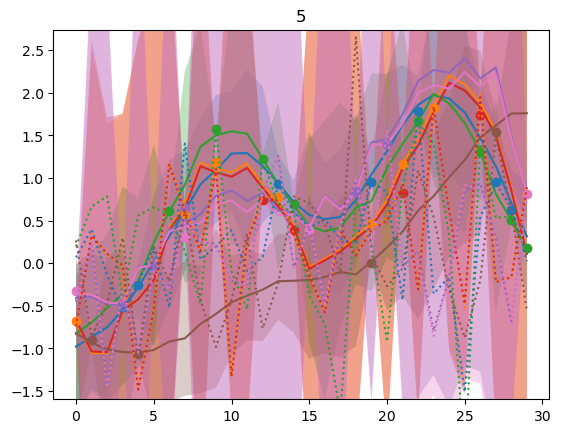

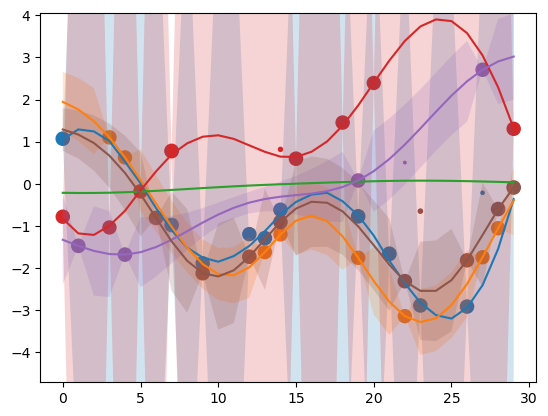

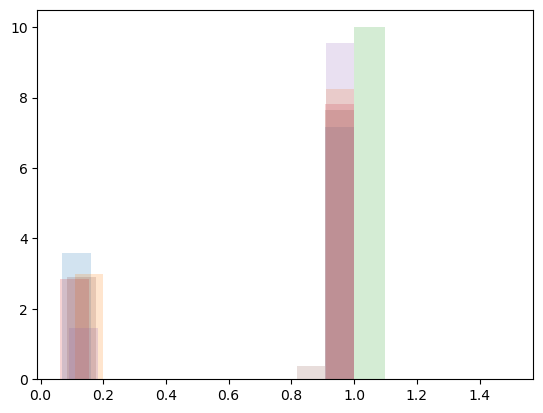

Epoch 3/2000: Training Loss = 0.484797, Validation Loss = 0.420935


1it [00:00,  6.09it/s]

tensor(0.8443)
0.04932507500052452 1.7598216533660889
tensor(0.8388)


2it [00:00,  6.09it/s]

0.05140175297856331 2.468851327896118
tensor(0.8368)


3it [00:00,  4.67it/s]

0.06247325986623764 1.4454166889190674
tensor(0.8488)
0.022275716066360474 1.552552342414856


5it [00:00,  5.49it/s]

tensor(0.8431)
0.028137270361185074 1.6425914764404297
tensor(0.8409)
0.2166500687599182 1.6524971723556519


6it [00:01,  5.95it/s]


tensor(0.8468)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8416)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8399)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


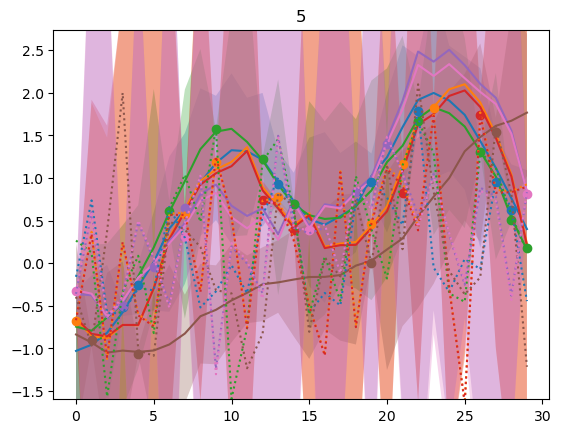

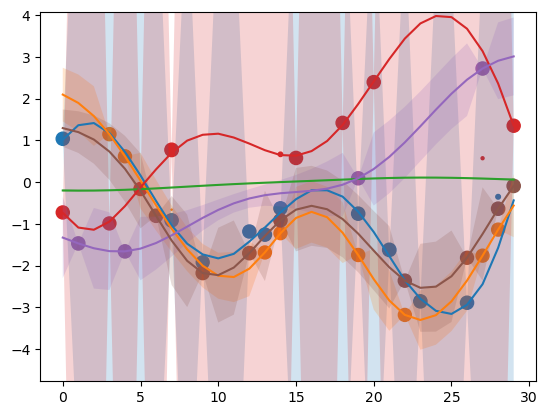

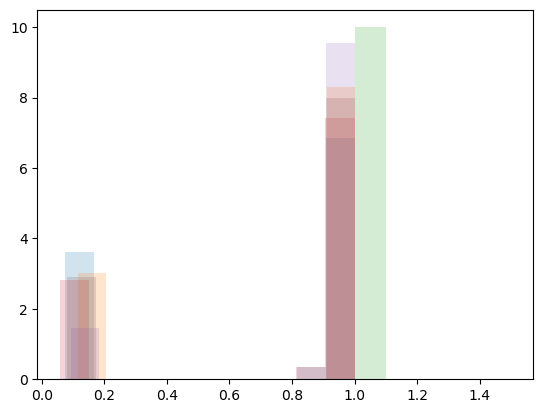

Epoch 4/2000: Training Loss = 0.519719, Validation Loss = 0.405916


1it [00:00,  6.19it/s]

tensor(0.8437)
0.03359431400895119 1.453902244567871
tensor(0.8411)


2it [00:00,  6.15it/s]

0.026569414883852005 1.671872615814209
tensor(0.8445)
0.06049419566988945 1.7585101127624512


4it [00:00,  6.12it/s]

tensor(0.8402)
0.05968473106622696 1.743043065071106
tensor(0.8393)


6it [00:00,  6.70it/s]

0.10944163799285889 1.9472848176956177
tensor(0.8409)
0.030541829764842987 1.7591630220413208
tensor(0.8476)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8441)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8429)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


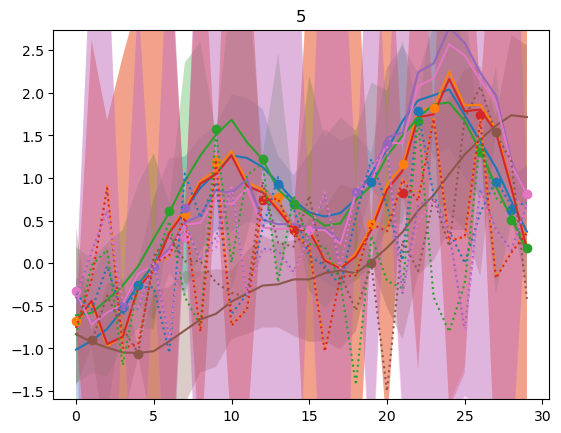

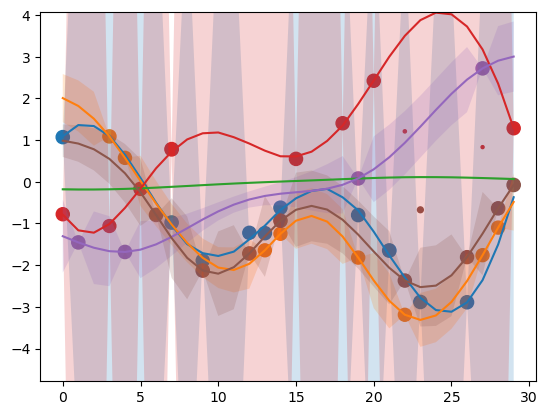

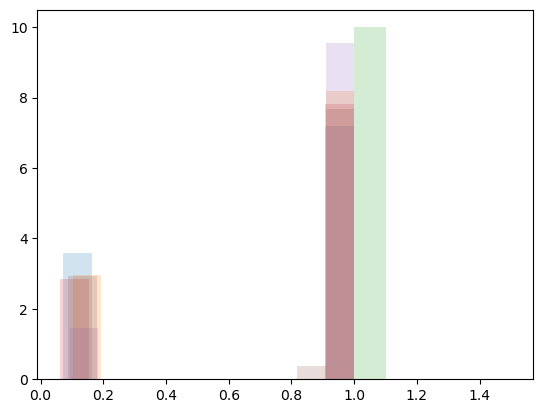

Epoch 5/2000: Training Loss = 0.497079, Validation Loss = 0.390357


1it [00:00,  6.15it/s]

tensor(0.8430)
0.05664968863129616 1.9839227199554443
tensor(0.8391)


2it [00:00,  6.12it/s]

0.02956155128777027 1.6676887273788452
tensor(0.8428)
0.06335373967885971 1.8504388332366943


4it [00:00,  6.14it/s]

tensor(0.8453)
0.08217336237430573 2.4035580158233643
tensor(0.8364)


6it [00:00,  6.70it/s]

0.027228975668549538 2.749582290649414
tensor(0.8483)
0.024397235363721848 1.9537229537963867
tensor(0.8488)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8398)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8374)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


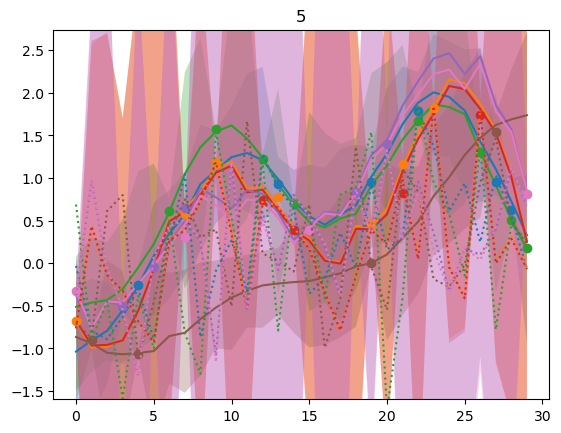

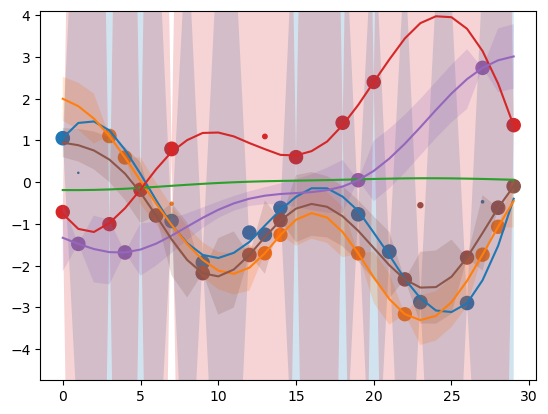

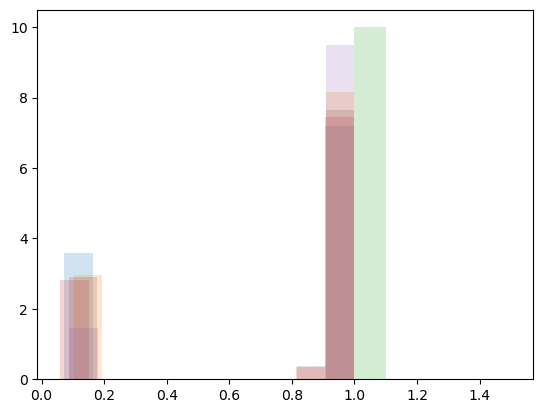

Epoch 6/2000: Training Loss = 0.565438, Validation Loss = 0.408591


1it [00:00,  6.12it/s]

tensor(0.8432)
0.07032964378595352 2.9578680992126465
tensor(0.8478)


2it [00:00,  6.07it/s]

0.021616589277982712 1.918775200843811
tensor(0.8440)
0.031147630885243416 1.838644027709961


3it [00:00,  6.10it/s]

tensor(0.8414)
0.054402291774749756 2.114999294281006


4it [00:00,  5.12it/s]

tensor(0.8405)
0.08497371524572372 1.8484092950820923


6it [00:01,  5.51it/s]


tensor(0.8426)
0.03566240146756172 1.7957432270050049
tensor(0.8463)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8441)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8427)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


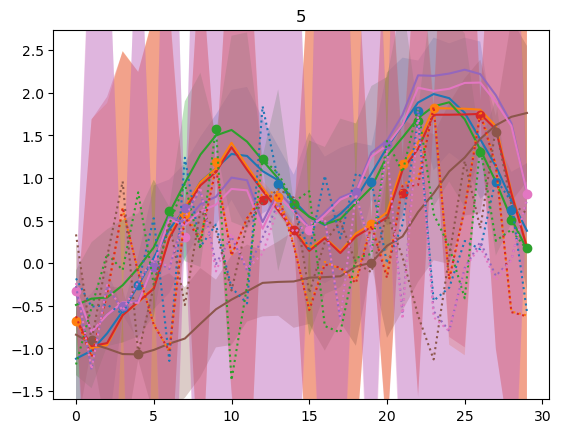

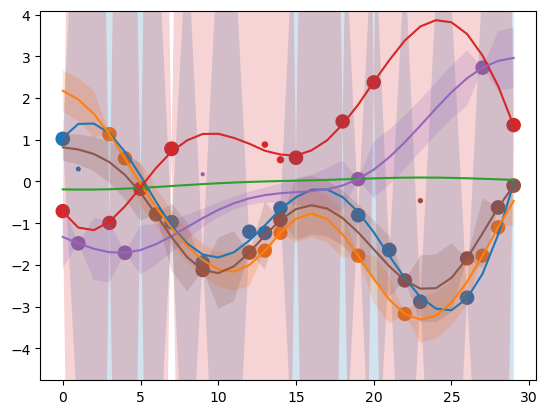

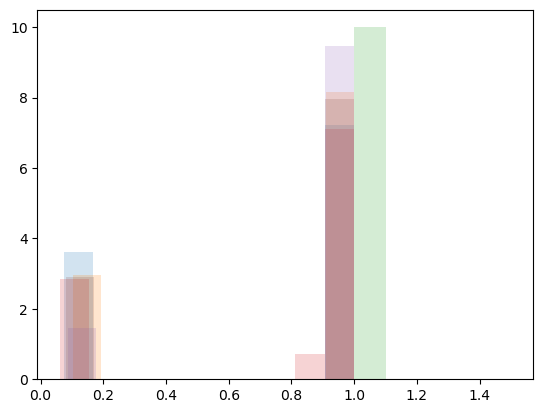

Epoch 7/2000: Training Loss = 0.561648, Validation Loss = 0.428877


1it [00:00,  6.25it/s]

tensor(0.8456)
0.050297584384679794 1.678106427192688
tensor(0.8430)


2it [00:00,  6.19it/s]

0.028802940621972084 1.7395603656768799
tensor(0.8420)
0.03905847668647766 1.5987640619277954


4it [00:00,  6.17it/s]

tensor(0.8432)
0.03047247603535652 1.7738033533096313
tensor(0.8434)


6it [00:00,  6.71it/s]

0.0442894883453846 1.7989702224731445
tensor(0.8424)
0.015578039921820164 2.1925899982452393
tensor(0.8477)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8422)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8386)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7753)


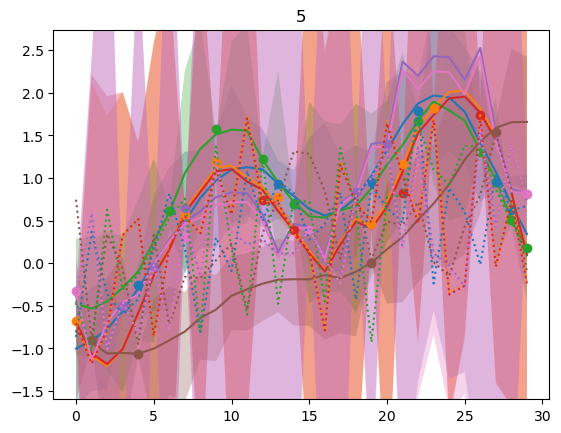

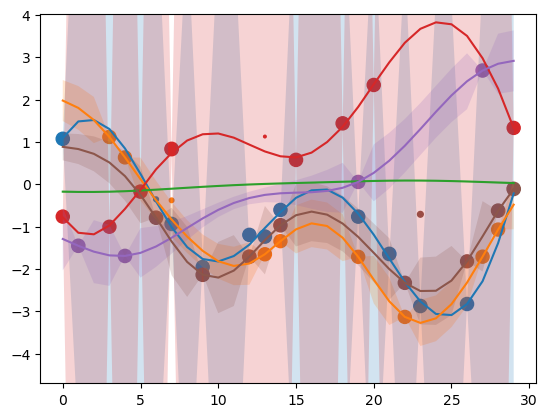

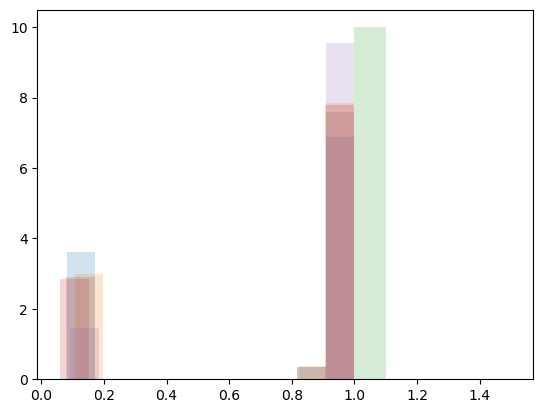

Epoch 8/2000: Training Loss = 0.492003, Validation Loss = 0.375786


1it [00:00,  6.08it/s]

tensor(0.8411)
0.02527383342385292 1.7421228885650635
tensor(0.8368)


2it [00:00,  6.09it/s]

0.024405552074313164 1.9657820463180542
tensor(0.8475)
0.02853371575474739 1.7156833410263062


4it [00:00,  6.12it/s]

tensor(0.8472)
0.046050168573856354 2.011091947555542
tensor(0.8398)


6it [00:00,  6.68it/s]

0.03058900684118271 1.7982079982757568
tensor(0.8370)
0.046651437878608704 2.5406336784362793
tensor(0.8506)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8422)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8452)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


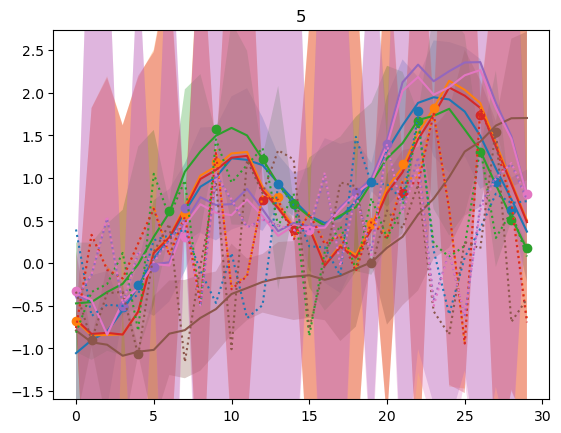

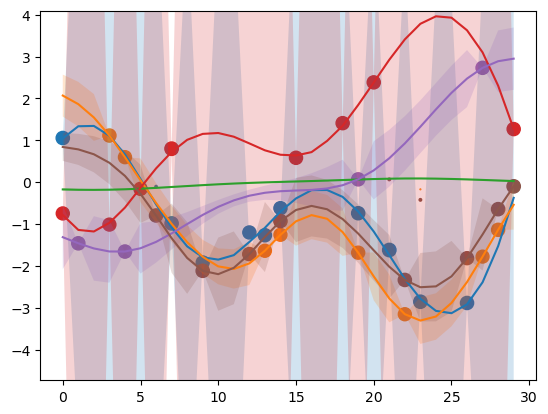

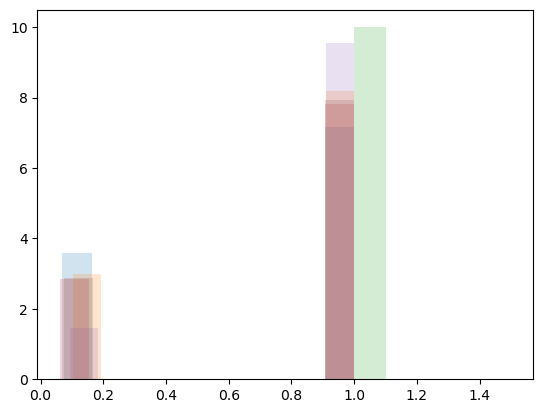

Epoch 9/2000: Training Loss = 0.524824, Validation Loss = 0.356815


1it [00:00,  6.10it/s]

tensor(0.8464)
0.06270332634449005 1.5618606805801392
tensor(0.8431)


2it [00:00,  6.13it/s]

0.020539967343211174 2.0370452404022217
tensor(0.8391)
0.03336176648736 1.847787857055664


4it [00:00,  6.16it/s]

tensor(0.8449)
0.062389787286520004 2.3015103340148926
tensor(0.8398)


6it [00:00,  6.71it/s]

0.025662703439593315 1.6277599334716797
tensor(0.8450)
0.03509962186217308 1.3072303533554077
tensor(0.8475)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8425)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8394)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


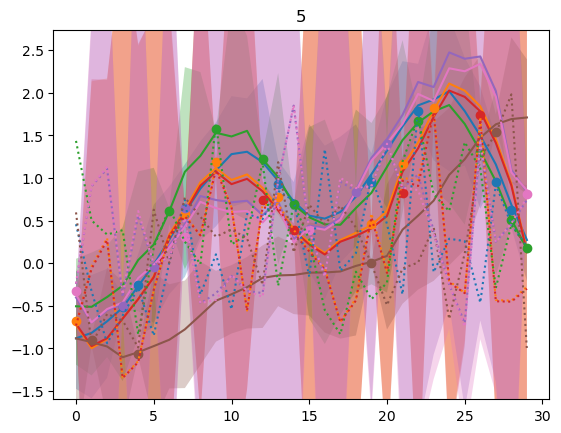

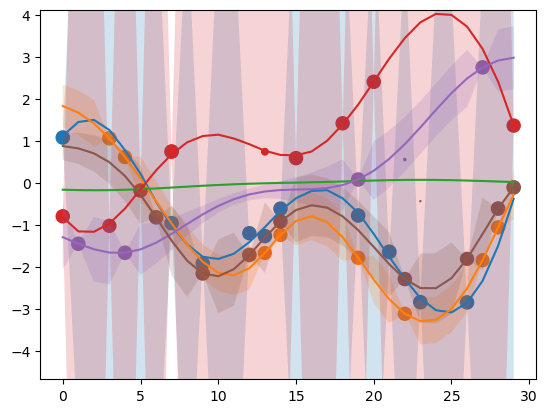

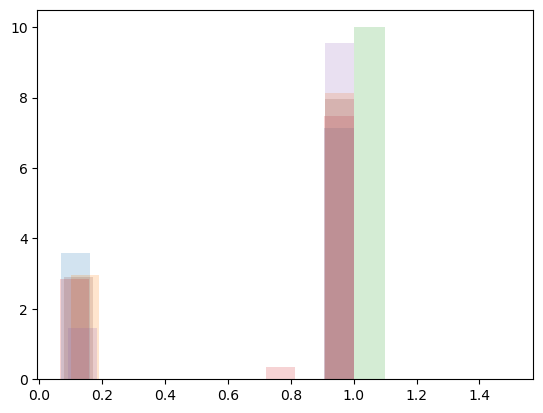

Epoch 10/2000: Training Loss = 0.493619, Validation Loss = 0.381342


0it [00:00, ?it/s]

tensor(0.8450)
0.02478480339050293 1.7166752815246582


2it [00:00,  4.75it/s]

tensor(0.8420)
0.07035055756568909 2.03233003616333
tensor(0.8403)


3it [00:00,  5.26it/s]

0.04577949270606041 1.7422350645065308
tensor(0.8390)
0.01652061566710472 1.5831998586654663


5it [00:00,  5.78it/s]

tensor(0.8375)
0.025237156078219414 1.7294814586639404
tensor(0.8431)
0.011854185722768307 1.5875144004821777


6it [00:01,  5.92it/s]


tensor(0.8484)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8428)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8399)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


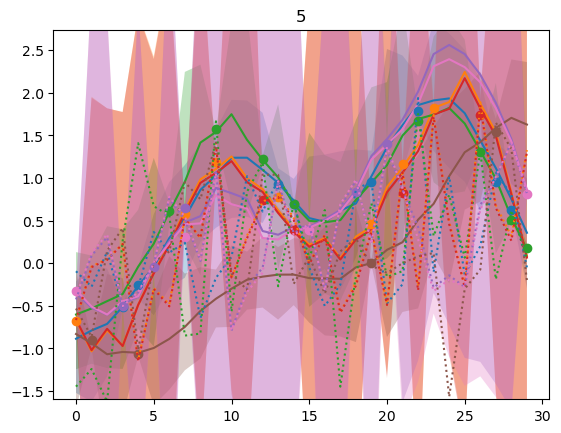

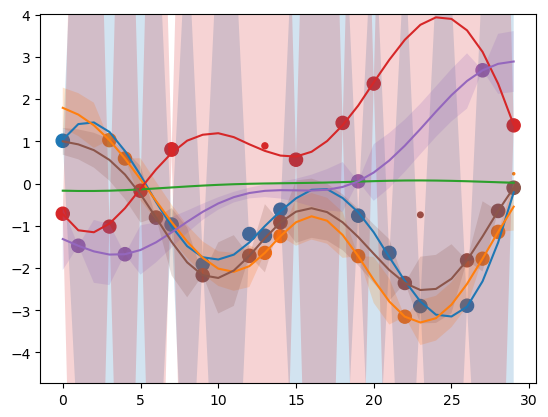

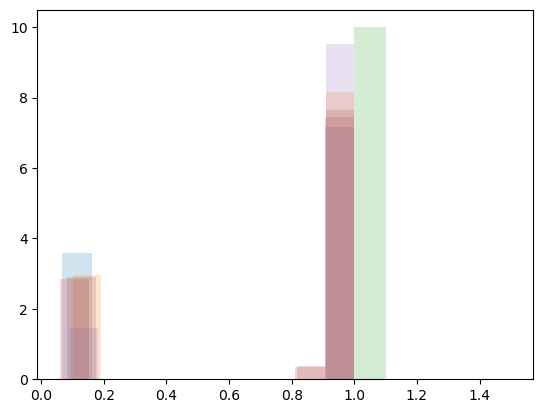

Epoch 11/2000: Training Loss = 0.475945, Validation Loss = 0.321504


1it [00:00,  6.13it/s]

tensor(0.8396)
0.017607789486646652 1.2596145868301392
tensor(0.8445)


2it [00:00,  6.14it/s]

0.03810103237628937 2.047943115234375
tensor(0.8411)
0.036957815289497375 1.7530999183654785


4it [00:00,  6.16it/s]

tensor(0.8391)
0.03868234530091286 1.5265003442764282
tensor(0.8404)


6it [00:00,  6.70it/s]

0.021212013438344002 1.4801440238952637
tensor(0.8530)
0.039234939962625504 1.7008975744247437
tensor(0.8508)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8433)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8402)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7747)


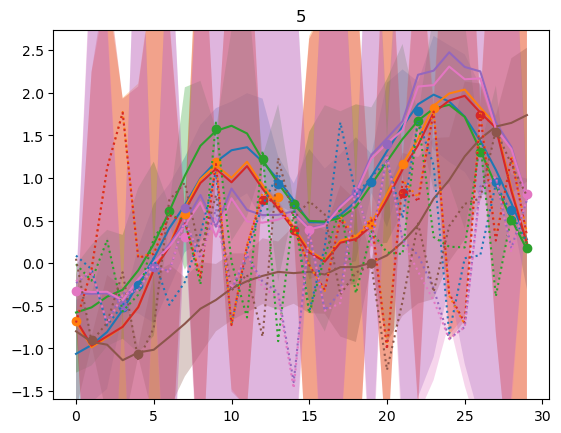

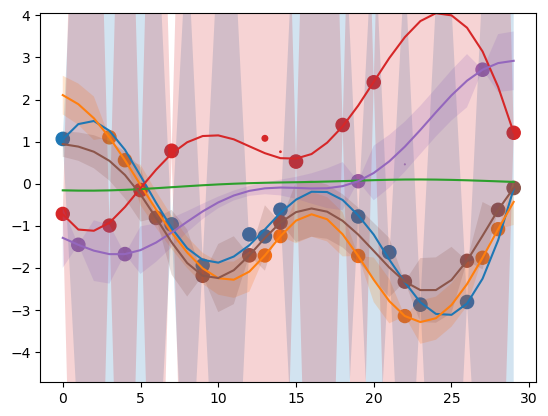

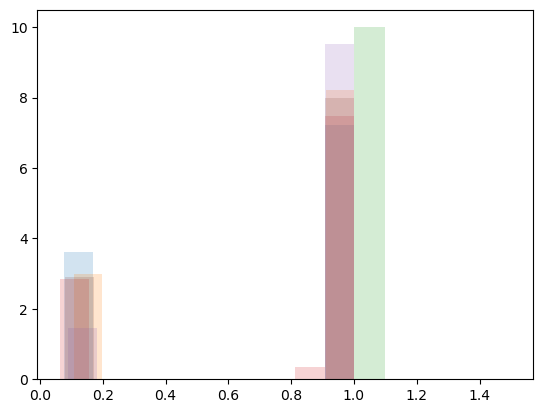

Epoch 12/2000: Training Loss = 0.454319, Validation Loss = 0.341679


1it [00:00,  6.10it/s]

tensor(0.8445)
0.05930918827652931 2.1116247177124023
tensor(0.8451)


2it [00:00,  6.11it/s]

0.009644783101975918 1.4779109954833984
tensor(0.8443)
0.036003924906253815 1.6840176582336426


4it [00:00,  6.14it/s]

tensor(0.8323)
0.025840096175670624 1.2868081331253052
tensor(0.8407)


6it [00:00,  6.71it/s]

0.03788638487458229 1.6036592721939087
tensor(0.8463)
0.026769982650876045 2.1915299892425537
tensor(0.8519)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8417)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8429)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


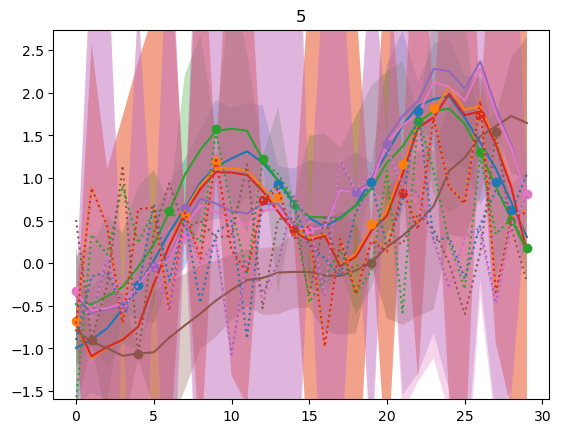

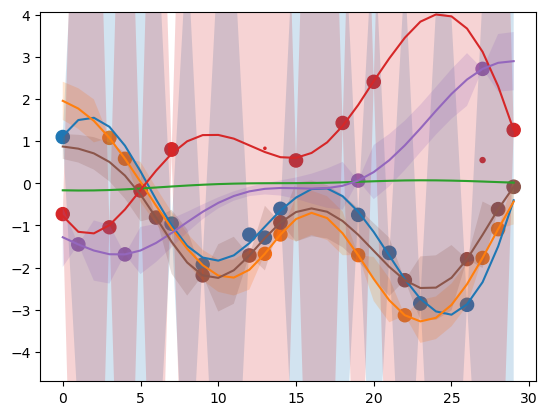

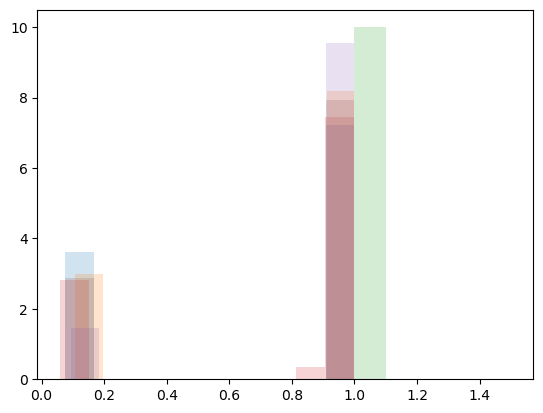

Epoch 13/2000: Training Loss = 0.472996, Validation Loss = 0.380476


1it [00:00,  6.14it/s]

tensor(0.8420)
0.03171345964074135 1.4378125667572021
tensor(0.8418)


2it [00:00,  4.42it/s]

0.023600896820425987 1.4300305843353271
tensor(0.8460)
0.014262862503528595 1.609838604927063


4it [00:00,  5.45it/s]

tensor(0.8438)
0.03960760682821274 1.3269906044006348
tensor(0.8469)


6it [00:01,  5.99it/s]

0.022515738382935524 1.2850489616394043
tensor(0.8431)
0.02323388308286667 1.48233962059021
tensor(0.8515)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8423)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8437)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


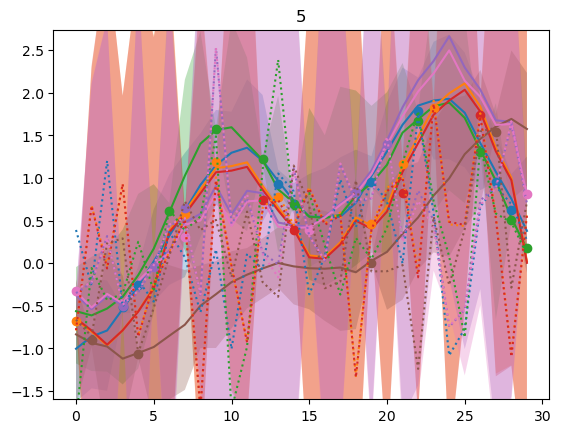

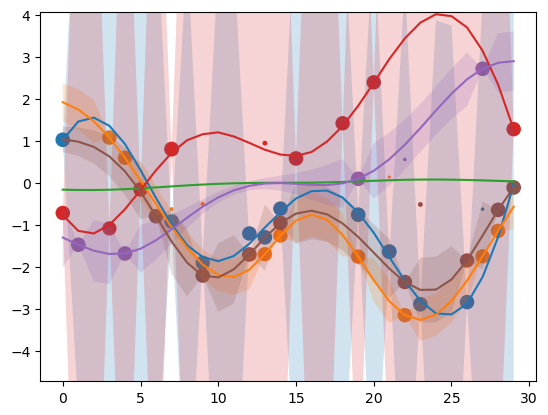

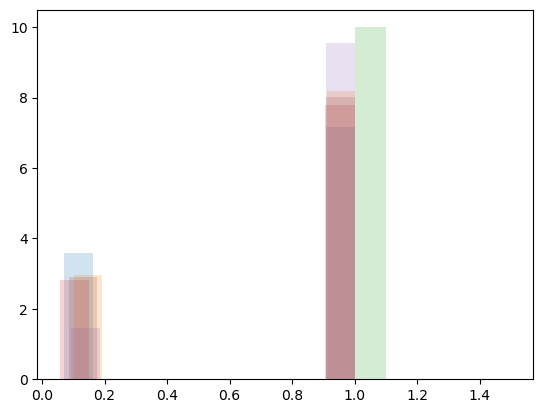

Epoch 14/2000: Training Loss = 0.407895, Validation Loss = 0.360271


1it [00:00,  6.18it/s]

tensor(0.8402)
0.018549393862485886 1.2042924165725708
tensor(0.8483)


2it [00:00,  6.18it/s]

0.020257335156202316 1.8797770738601685
tensor(0.8376)
0.034123606979846954 1.2288405895233154


4it [00:00,  6.13it/s]

tensor(0.8418)
0.03565676137804985 1.3047330379486084
tensor(0.8454)


6it [00:00,  6.71it/s]

0.01854987069964409 1.6524977684020996
tensor(0.8378)
0.046858955174684525 1.3987830877304077
tensor(0.8494)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8406)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8434)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7753)


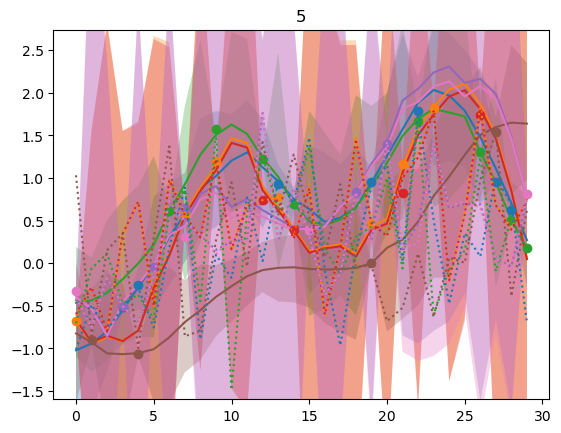

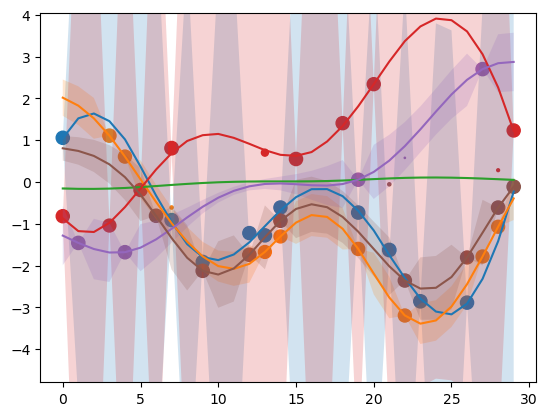

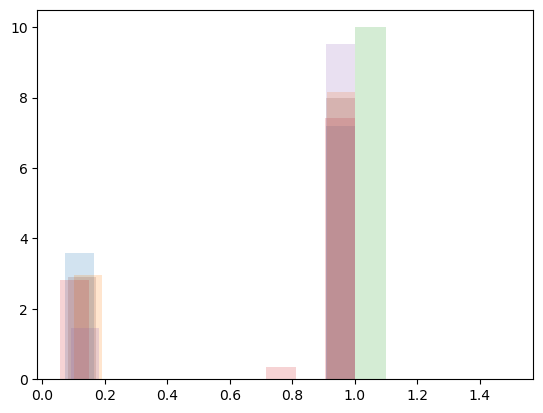

Epoch 15/2000: Training Loss = 0.412390, Validation Loss = 0.255469


1it [00:00,  6.12it/s]

tensor(0.8375)
0.012261110357940197 1.3341410160064697
tensor(0.8495)


2it [00:00,  6.08it/s]

0.045536626130342484 1.6724152565002441
tensor(0.8433)
0.02589576505124569 1.4653043746948242


4it [00:00,  6.12it/s]

tensor(0.8443)
0.017490236088633537 1.84514319896698
tensor(0.8411)


6it [00:00,  6.68it/s]

0.024351833388209343 1.4240715503692627
tensor(0.8409)
0.014347062446177006 1.1821988821029663
tensor(0.8472)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8421)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8434)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7750)


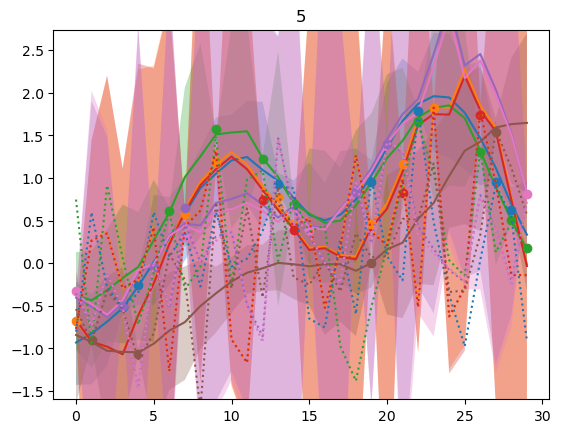

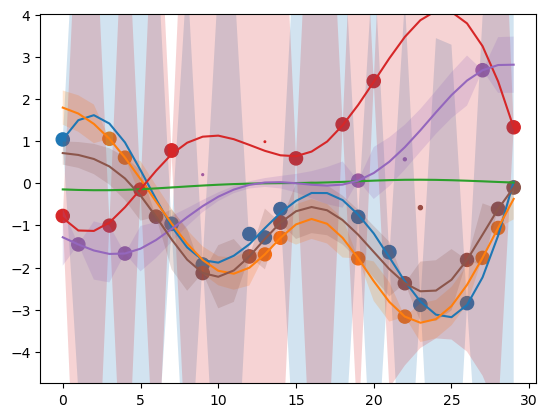

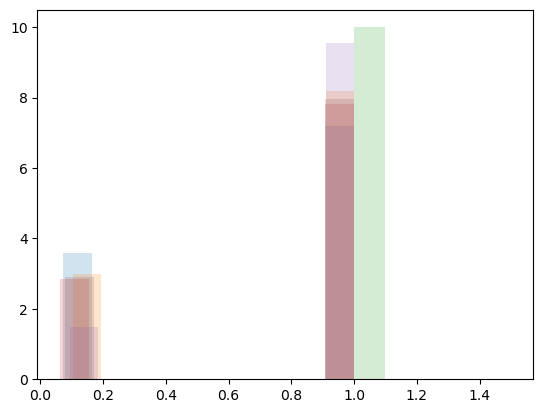

Epoch 16/2000: Training Loss = 0.414587, Validation Loss = 0.228811


1it [00:00,  6.16it/s]

tensor(0.8390)
0.030518701300024986 1.1890252828598022
tensor(0.8442)


2it [00:00,  4.40it/s]

0.02818298526108265 1.4025074243545532
tensor(0.8372)
0.024961918592453003 1.1496597528457642


4it [00:00,  5.39it/s]

tensor(0.8476)
0.016850626096129417 1.585692048072815
tensor(0.8414)


6it [00:01,  5.96it/s]

0.01151317823678255 1.4052481651306152
tensor(0.8498)
0.046539098024368286 1.1630157232284546
tensor(0.8485)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8438)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8407)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


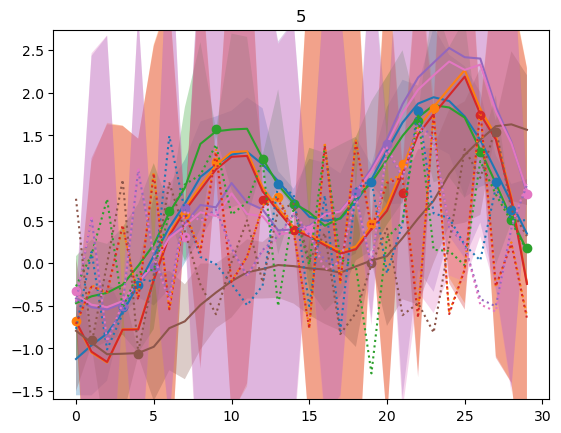

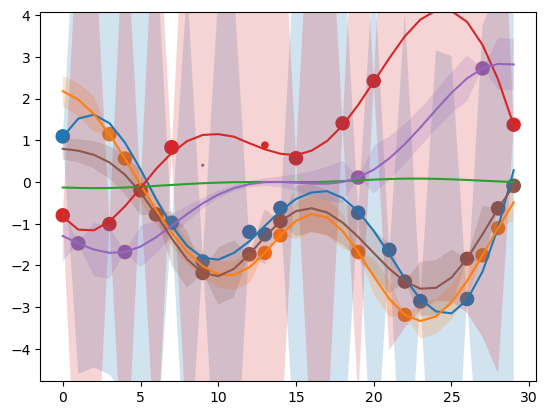

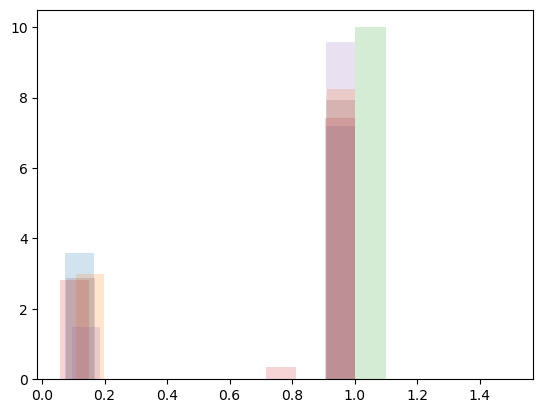

Epoch 17/2000: Training Loss = 0.381957, Validation Loss = 0.239580


1it [00:00,  6.21it/s]

tensor(0.8411)
0.02618439868092537 1.0946221351623535
tensor(0.8398)


2it [00:00,  6.17it/s]

0.018937962129712105 1.2316431999206543
tensor(0.8481)
0.031227638944983482 1.1695234775543213


4it [00:00,  6.10it/s]

tensor(0.8448)
0.014757038094103336 1.051051378250122
tensor(0.8423)


6it [00:00,  6.68it/s]

0.01137950923293829 1.4035735130310059
tensor(0.8465)
0.012375377118587494 1.0869454145431519
tensor(0.8464)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8437)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8364)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


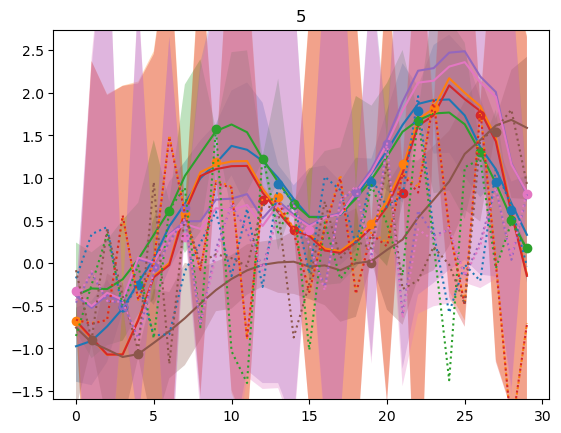

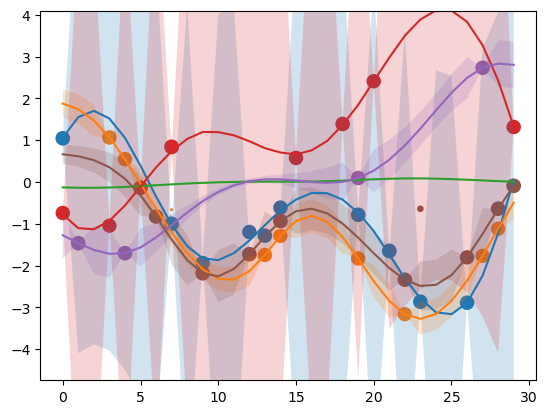

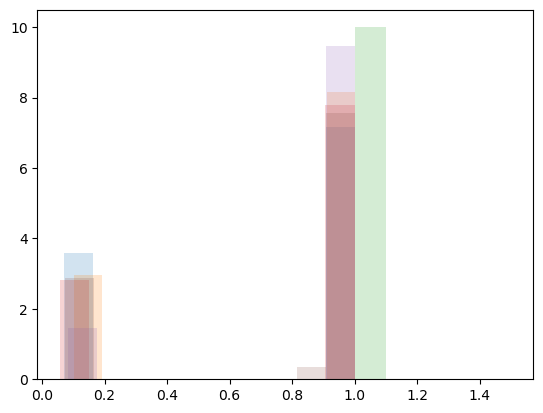

Epoch 18/2000: Training Loss = 0.344456, Validation Loss = 0.235133


1it [00:00,  6.16it/s]

tensor(0.8426)
0.01730450987815857 0.9544807076454163
tensor(0.8403)


2it [00:00,  6.11it/s]

0.018779924139380455 0.9536561369895935
tensor(0.8445)
0.02166163921356201 1.0782352685928345


4it [00:00,  6.12it/s]

tensor(0.8427)
0.01762354001402855 0.981449544429779
tensor(0.8423)


6it [00:00,  6.69it/s]

0.014774879440665245 0.9521418809890747
tensor(0.8413)
0.030134005472064018 0.9735243320465088
tensor(0.8470)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8395)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8409)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7747)


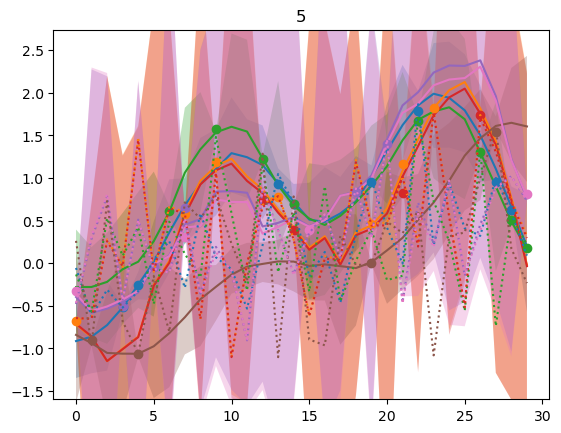

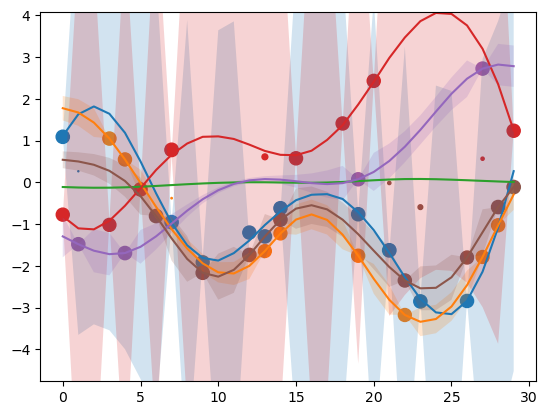

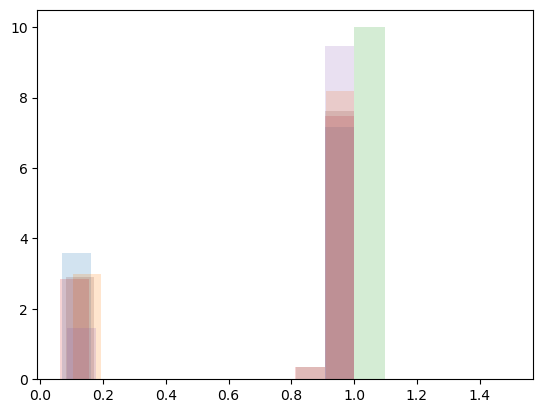

Epoch 19/2000: Training Loss = 0.305186, Validation Loss = 0.222146


1it [00:00,  6.18it/s]

tensor(0.8431)
0.010605517774820328 1.2836557626724243
tensor(0.8433)


2it [00:00,  6.17it/s]

0.03920886293053627 1.4190306663513184
tensor(0.8436)
0.02267269231379032 0.8583202362060547


3it [00:00,  6.14it/s]

tensor(0.8419)
0.010874345898628235 1.473643183708191


5it [00:00,  5.25it/s]

tensor(0.8397)
0.028235672041773796 0.9862650632858276
tensor(0.8444)
0.01834048144519329 0.7546467781066895


6it [00:01,  5.96it/s]


tensor(0.8443)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8450)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8482)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7750)


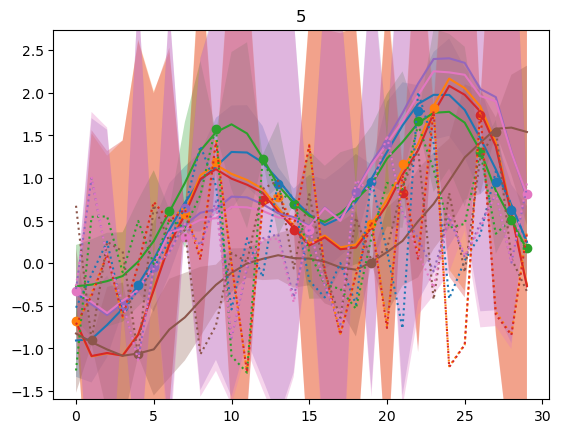

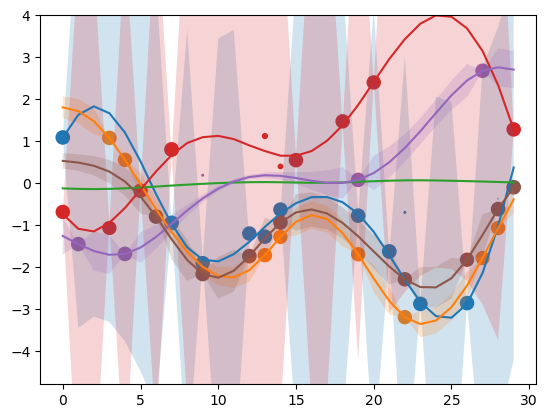

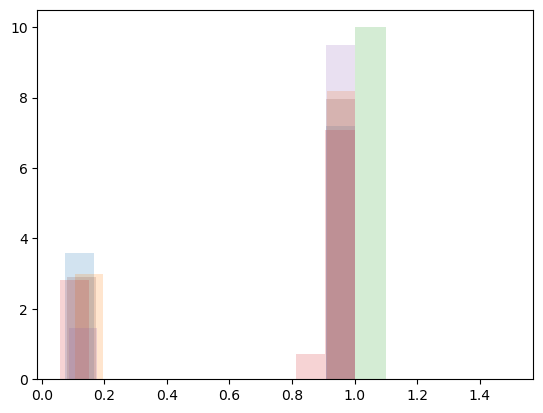

Epoch 20/2000: Training Loss = 0.333844, Validation Loss = 0.294535


1it [00:00,  5.96it/s]

tensor(0.8430)
0.024091826751828194 1.0452126264572144
tensor(0.8382)


2it [00:00,  5.97it/s]

0.023403016850352287 1.4026806354522705
tensor(0.8464)
0.01886642538011074 0.9933632016181946


4it [00:00,  6.01it/s]

tensor(0.8396)
0.014070998877286911 1.2461726665496826
tensor(0.8453)


6it [00:00,  6.53it/s]

0.026792505756020546 1.0562282800674438
tensor(0.8511)
0.011948059312999249 1.1253353357315063
tensor(0.8458)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8467)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8422)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


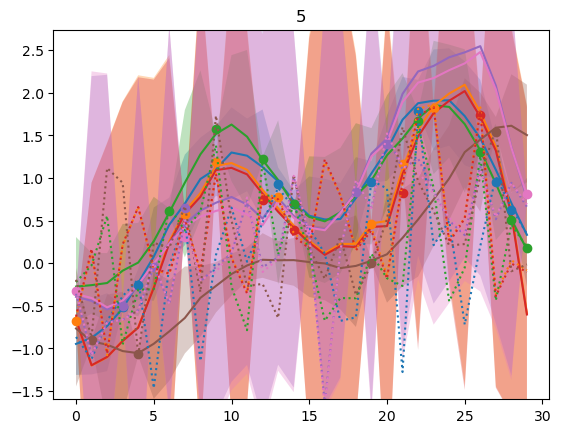

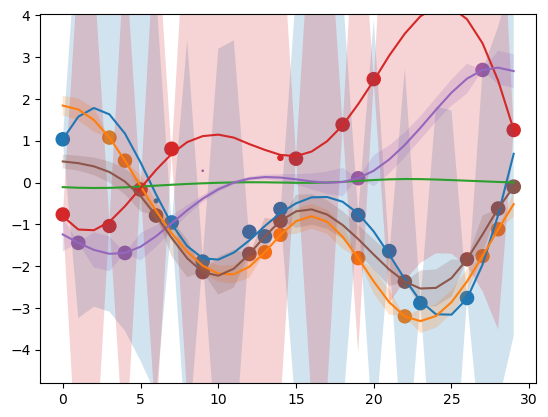

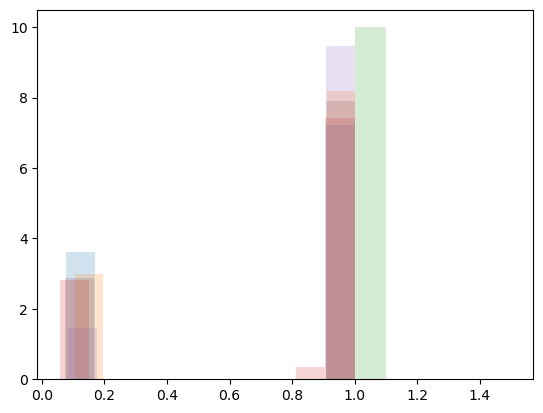

Epoch 21/2000: Training Loss = 0.333220, Validation Loss = 0.267683


1it [00:00,  5.99it/s]

tensor(0.8466)
0.014435584656894207 1.1557763814926147
tensor(0.8389)


2it [00:00,  6.09it/s]

0.011064140126109123 1.0562154054641724
tensor(0.8452)
0.025300106033682823 0.9201704263687134


4it [00:00,  6.15it/s]

tensor(0.8380)
0.013261852785944939 1.5849130153656006
tensor(0.8438)


5it [00:00,  6.14it/s]

0.03743656724691391 1.1672362089157104
tensor(0.8457)
0.015697801485657692 0.8266253471374512


6it [00:00,  6.18it/s]


tensor(0.8496)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8436)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8351)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


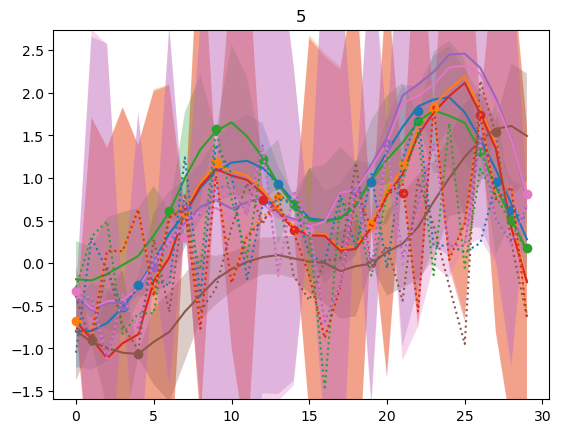

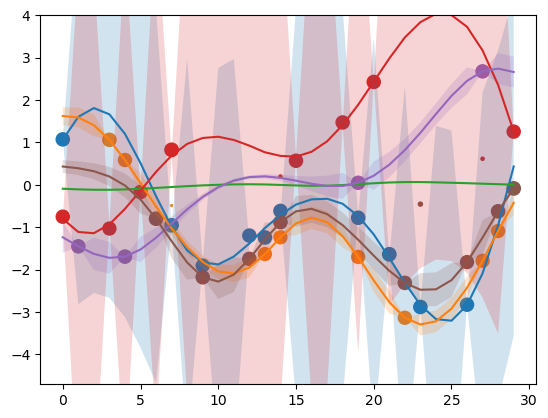

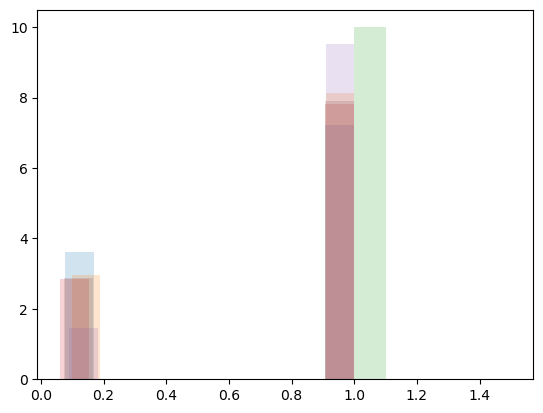

Epoch 22/2000: Training Loss = 0.326703, Validation Loss = 0.225459


1it [00:00,  6.13it/s]

tensor(0.8373)
0.020770849660038948 1.002035140991211
tensor(0.8470)


2it [00:00,  6.14it/s]

0.016251761466264725 0.9429188966751099
tensor(0.8394)
0.014278944581747055 1.0959619283676147


3it [00:00,  6.10it/s]

tensor(0.8416)
0.014216218143701553 1.0500644445419312


5it [00:00,  5.16it/s]

tensor(0.8446)
0.00992946419864893 1.0987766981124878
tensor(0.8407)
0.018190830945968628 0.886262059211731


6it [00:01,  5.90it/s]


tensor(0.8474)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8401)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8455)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7760)


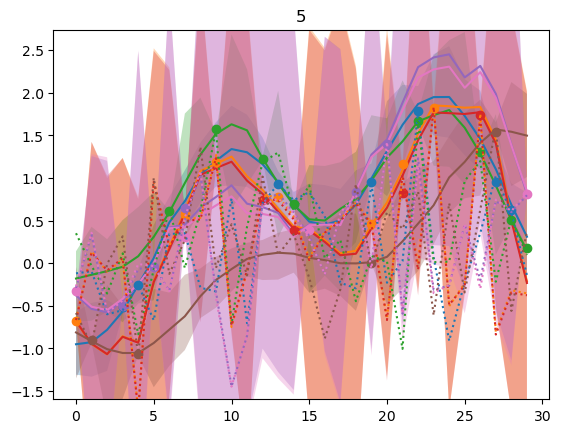

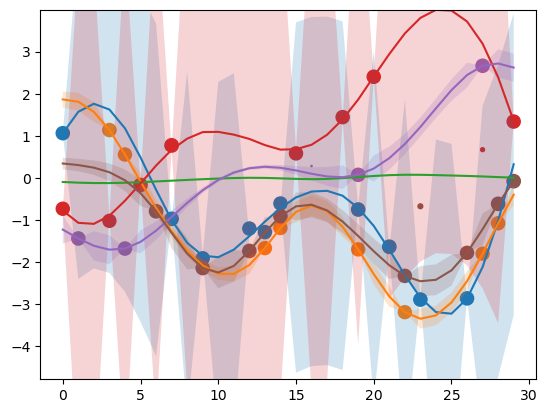

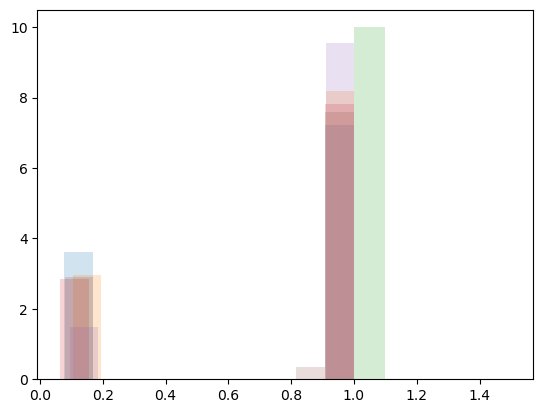

Epoch 23/2000: Training Loss = 0.300369, Validation Loss = 0.263624


1it [00:00,  6.20it/s]

tensor(0.8407)
0.016147028654813766 1.3976285457611084
tensor(0.8416)


2it [00:00,  6.21it/s]

0.01056255679577589 1.205071210861206
tensor(0.8457)
0.027756687253713608 1.0295581817626953


4it [00:00,  6.19it/s]

tensor(0.8444)
0.02101953700184822 1.0977643728256226
tensor(0.8457)


6it [00:00,  6.74it/s]

0.009577496908605099 0.9775604605674744
tensor(0.8448)
0.0188137274235487 0.7663471698760986
tensor(0.8481)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8446)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8407)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7753)


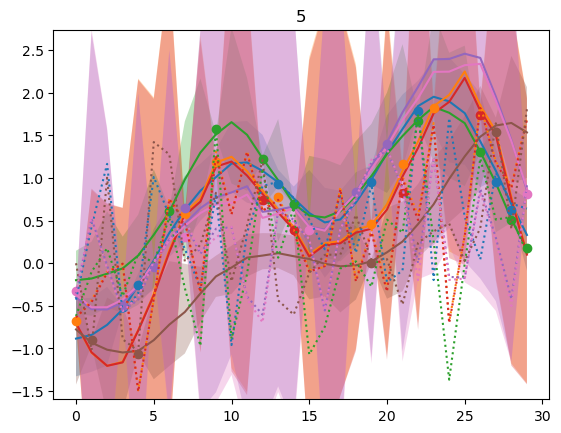

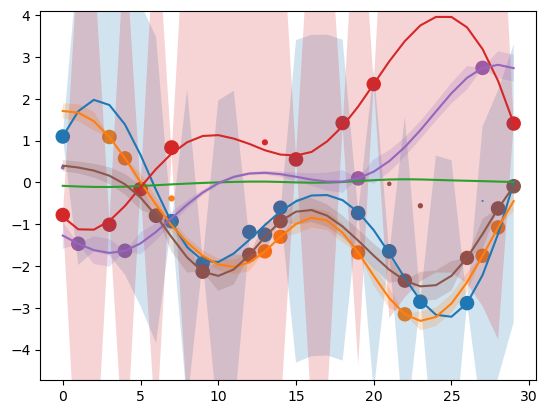

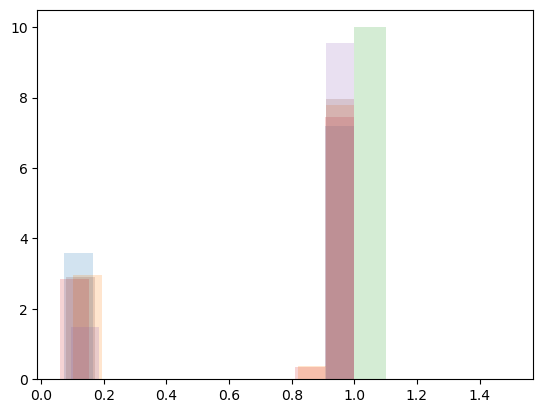

Epoch 24/2000: Training Loss = 0.313053, Validation Loss = 0.187435


1it [00:00,  6.05it/s]

tensor(0.8412)
0.015588166192173958 1.126875877380371
tensor(0.8404)


2it [00:00,  6.01it/s]

0.009080274030566216 0.8417257070541382
tensor(0.8438)
0.023526236414909363 1.1200275421142578


4it [00:00,  6.10it/s]

tensor(0.8417)
0.01993641071021557 0.9738361239433289
tensor(0.8450)


6it [00:00,  6.66it/s]

0.019793065264821053 1.195746660232544
tensor(0.8428)
0.0062821111641824245 1.1730449199676514
tensor(0.8502)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8430)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8359)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


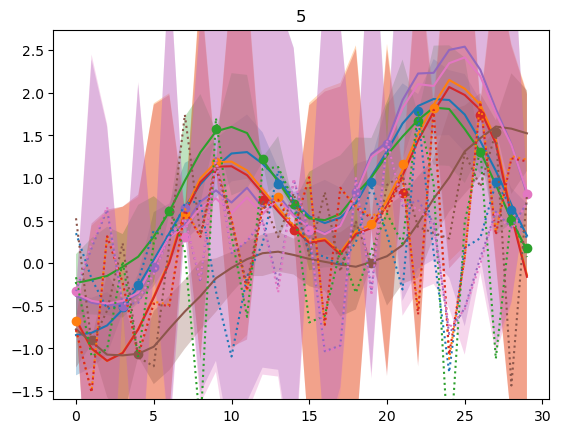

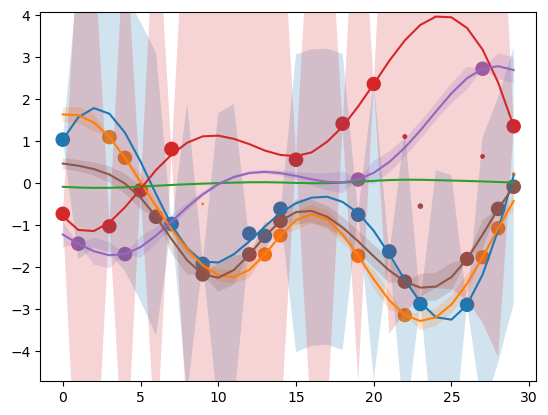

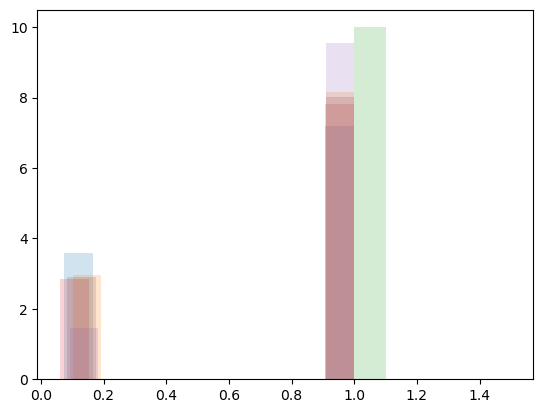

Epoch 25/2000: Training Loss = 0.311152, Validation Loss = 0.221562


1it [00:00,  5.65it/s]

tensor(0.8371)
0.011426622979342937 1.0093358755111694
tensor(0.8385)


2it [00:00,  5.78it/s]

0.017781153321266174 1.2881141901016235
tensor(0.8443)
0.01302553154528141 1.031356692314148


4it [00:00,  6.01it/s]

tensor(0.8433)
0.014652758836746216 1.2352545261383057
tensor(0.8450)


6it [00:00,  6.47it/s]

0.013584553264081478 1.0398550033569336
tensor(0.8498)
0.013010947033762932 1.0011987686157227
tensor(0.8510)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8385)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8394)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7753)


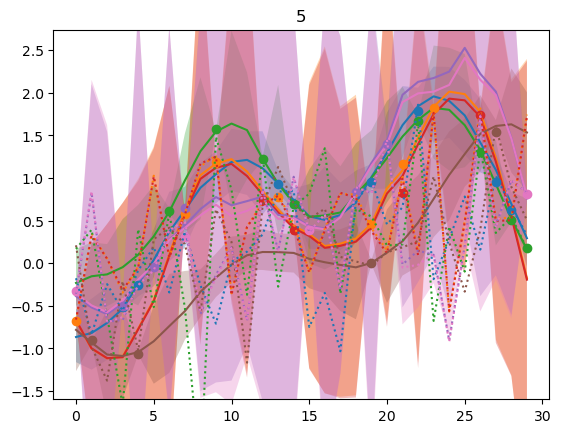

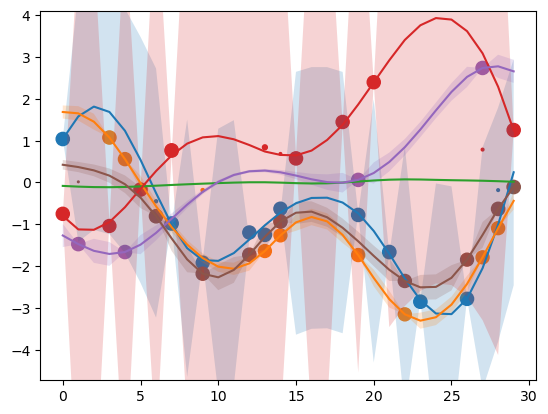

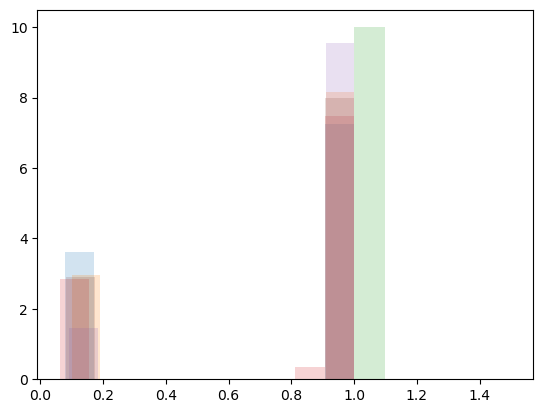

Epoch 26/2000: Training Loss = 0.314232, Validation Loss = 0.209551


0it [00:00, ?it/s]

tensor(0.8386)
0.012266437523066998 0.9121332168579102


1it [00:00,  3.61it/s]

tensor(0.8419)


2it [00:00,  4.76it/s]

0.01304533425718546 0.9098322987556458
tensor(0.8438)
0.012694653123617172 1.2000795602798462


3it [00:00,  5.16it/s]

tensor(0.8492)
0.01107035856693983 1.1417162418365479


4it [00:00,  5.43it/s]

tensor(0.8454)


5it [00:00,  5.66it/s]

0.011597986333072186 0.9780104756355286
tensor(0.8400)
0.01037345640361309 0.8078165650367737


6it [00:01,  5.82it/s]

tensor(0.8462)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8456)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8391)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


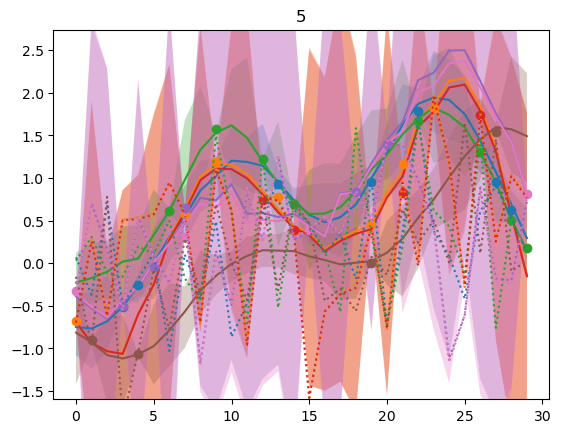

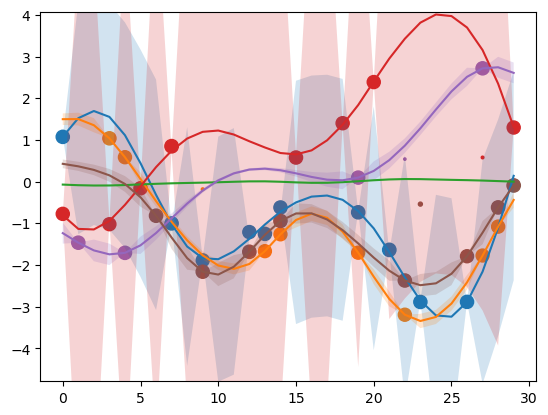

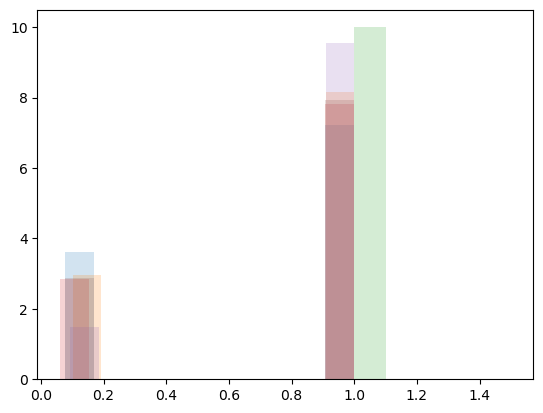

Epoch 27/2000: Training Loss = 0.289155, Validation Loss = 0.204167


1it [00:00,  5.73it/s]

tensor(0.8460)
0.009565701708197594 1.0427124500274658
tensor(0.8430)


2it [00:00,  5.83it/s]

0.008894979022443295 0.8103948831558228
tensor(0.8375)
0.013772621750831604 1.07675039768219


4it [00:00,  5.89it/s]

tensor(0.8431)
0.013533156365156174 1.028041958808899
tensor(0.8438)


6it [00:00,  6.41it/s]

0.009396371431648731 1.0810847282409668
tensor(0.8341)
0.03207505866885185 1.0818105936050415
tensor(0.8490)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8431)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8389)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


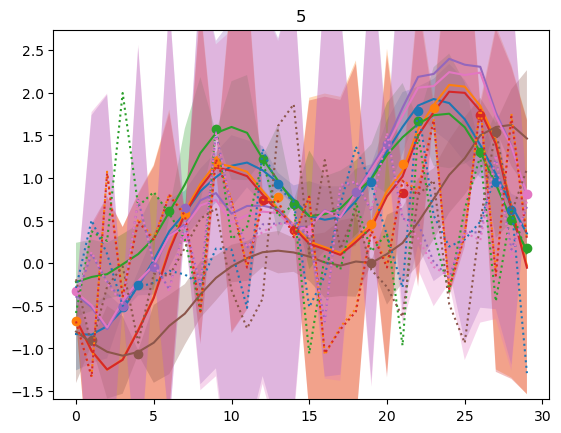

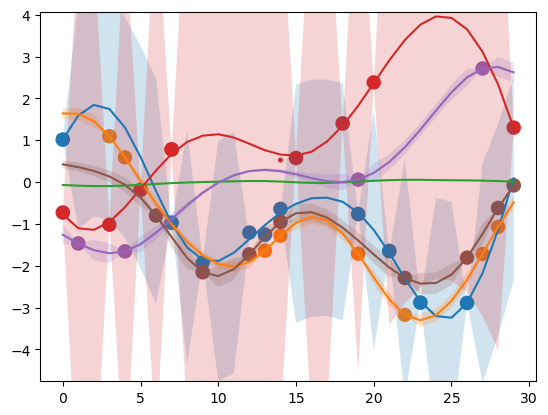

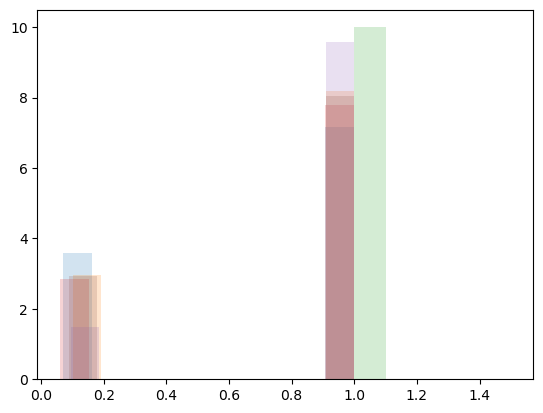

Epoch 28/2000: Training Loss = 0.295323, Validation Loss = 0.233544


1it [00:00,  6.03it/s]

tensor(0.8334)
0.012504340149462223 0.9206145405769348
tensor(0.8433)


2it [00:00,  6.01it/s]

0.017321763560175896 1.0972728729248047
tensor(0.8475)
0.011785827577114105 0.9218834638595581


4it [00:00,  5.91it/s]

tensor(0.8450)
0.010471178218722343 0.838180661201477
tensor(0.8471)


6it [00:00,  6.47it/s]

0.010277647525072098 0.8960095047950745
tensor(0.8380)
0.018601110205054283 1.3951666355133057
tensor(0.8492)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8436)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8409)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


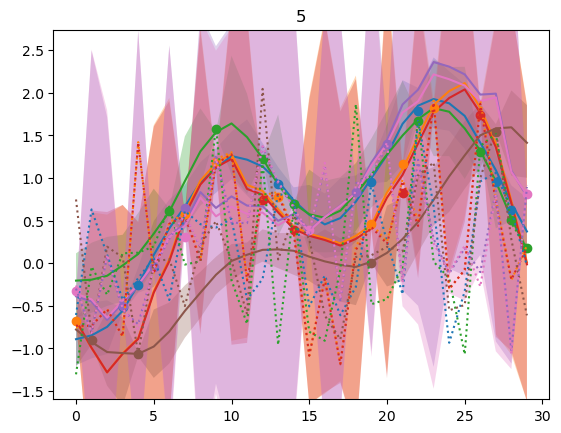

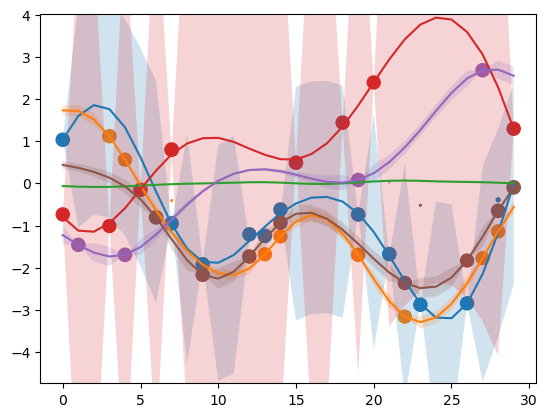

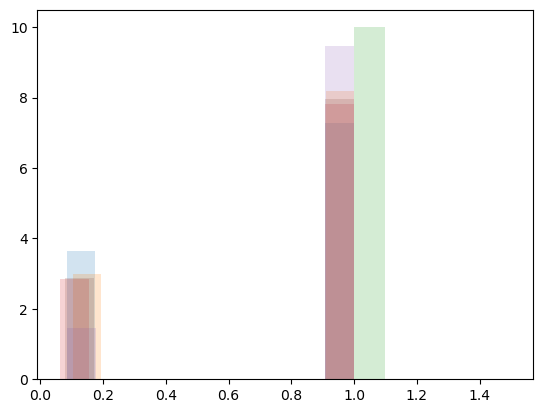

Epoch 29/2000: Training Loss = 0.292152, Validation Loss = 0.203743


0it [00:00, ?it/s]

tensor(0.8395)
0.009680978953838348 1.008823275566101


2it [00:00,  4.67it/s]

tensor(0.8414)
0.016521496698260307 1.5048706531524658
tensor(0.8472)


3it [00:00,  5.24it/s]

0.014967365190386772 0.8521089553833008
tensor(0.8395)
0.02209356427192688 0.7955294251441956


5it [00:00,  5.73it/s]

tensor(0.8385)
0.009865401312708855 0.9736435413360596
tensor(0.8317)
0.01713504083454609 0.7591407299041748


6it [00:01,  5.88it/s]


tensor(0.8446)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8431)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8432)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7750)


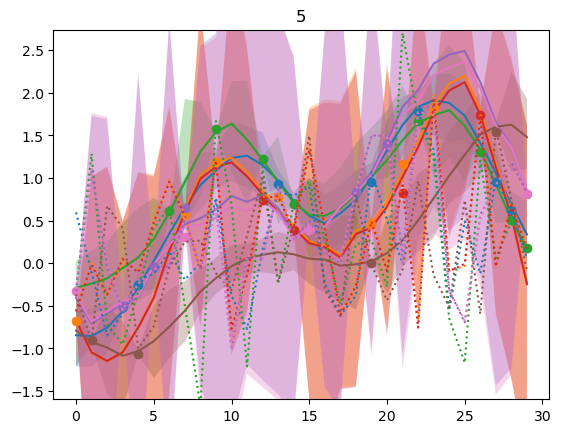

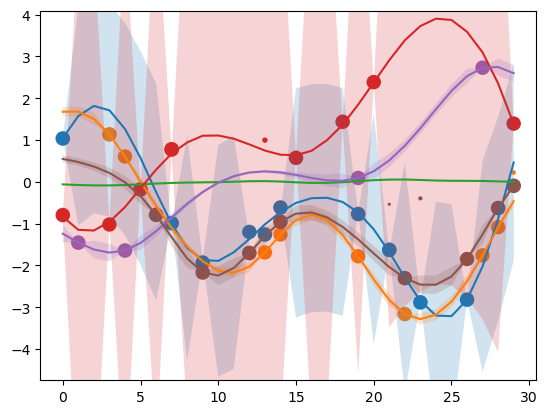

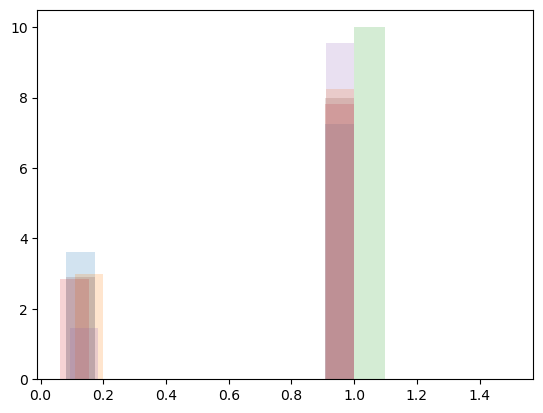

Epoch 30/2000: Training Loss = 0.287614, Validation Loss = 0.202139


1it [00:00,  6.12it/s]

tensor(0.8430)
0.01826084777712822 0.8757676482200623
tensor(0.8496)


2it [00:00,  6.13it/s]

0.011038429103791714 0.9691880345344543
tensor(0.8405)
0.01602758839726448 0.7760492563247681


4it [00:00,  5.92it/s]

tensor(0.8405)
0.013185584917664528 0.8694901466369629
tensor(0.8395)


6it [00:00,  6.46it/s]

0.009275098331272602 0.7949046492576599
tensor(0.8370)
0.024872399866580963 0.9182481169700623
tensor(0.8484)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8436)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8424)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7753)


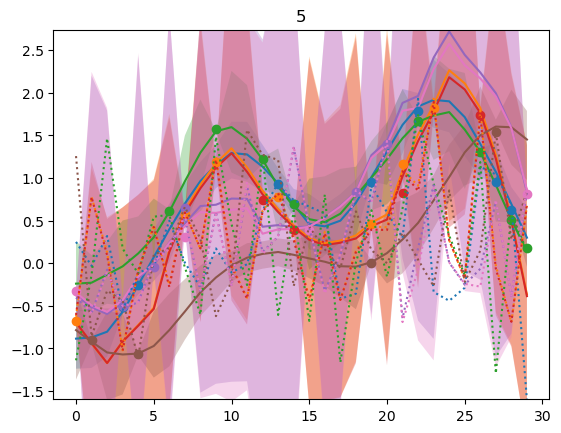

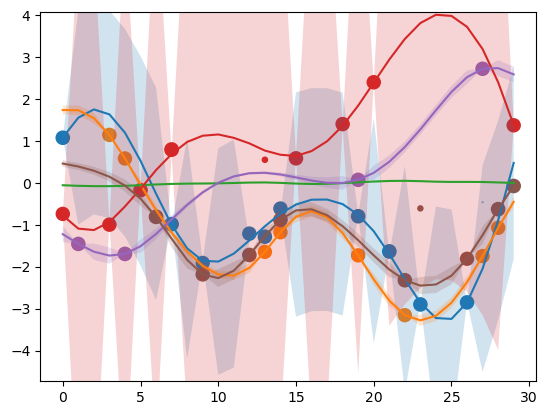

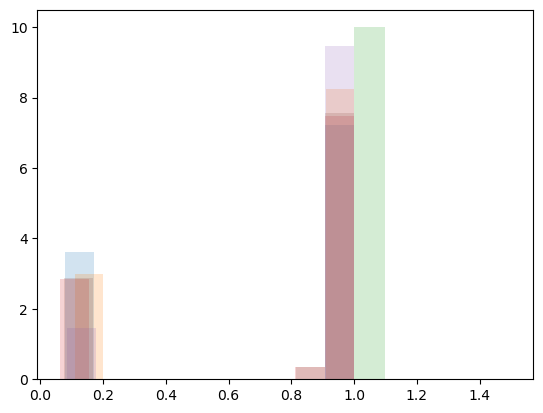

Epoch 31/2000: Training Loss = 0.263619, Validation Loss = 0.356939


1it [00:00,  6.11it/s]

tensor(0.8378)
0.009126574732363224 0.7480783462524414
tensor(0.8459)


2it [00:00,  6.16it/s]

0.01713988557457924 1.065913200378418
tensor(0.8418)
0.03700048476457596 0.9505609273910522


4it [00:00,  5.88it/s]

tensor(0.8404)
0.00980039406567812 0.9101629257202148
tensor(0.8467)


6it [00:00,  6.52it/s]

0.011882368475198746 1.0073813199996948
tensor(0.8444)
0.021625522524118423 1.1233501434326172
tensor(0.8455)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8410)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8364)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


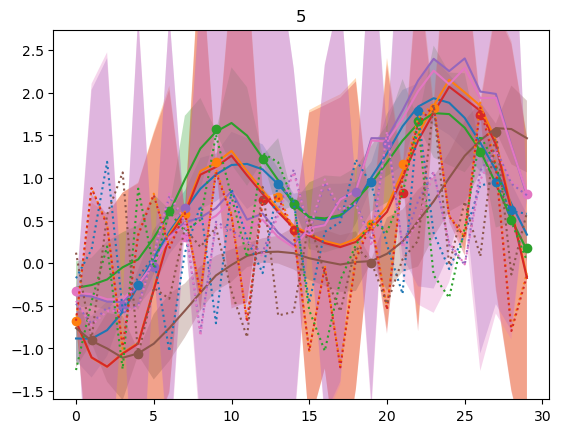

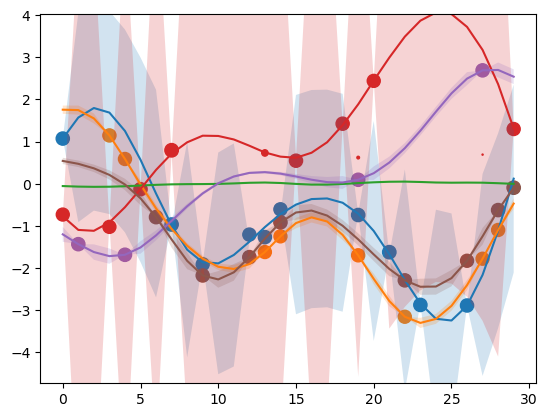

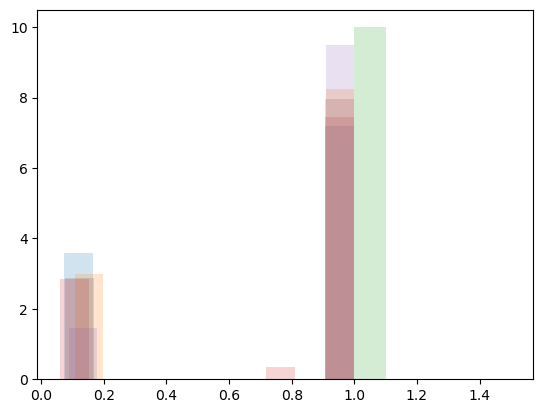

Epoch 32/2000: Training Loss = 0.284654, Validation Loss = 0.229186


1it [00:00,  6.04it/s]

tensor(0.8394)
0.011263523250818253 0.8262792229652405
tensor(0.8448)


2it [00:00,  4.33it/s]

0.010905408300459385 0.9557152986526489
tensor(0.8432)
0.015126853249967098 1.0331209897994995


4it [00:00,  5.40it/s]

tensor(0.8428)
0.01187620498239994 1.0251814126968384
tensor(0.8465)


6it [00:01,  5.94it/s]

0.011445051990449429 1.0326439142227173
tensor(0.8450)
0.013346904888749123 0.9015586376190186
tensor(0.8487)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8377)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8328)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


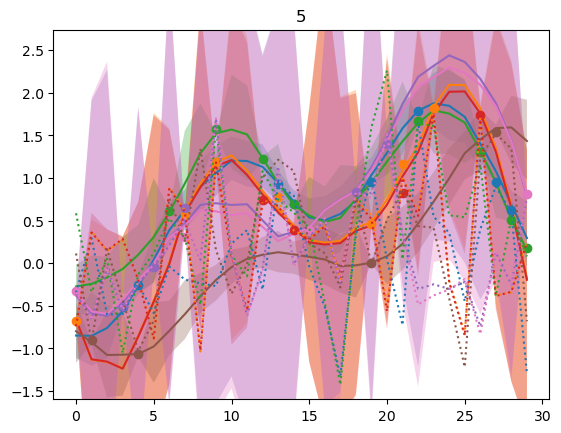

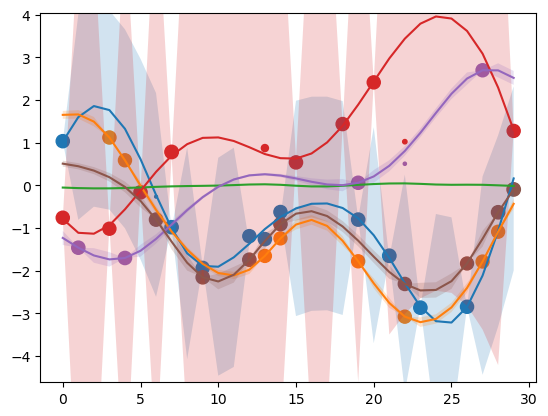

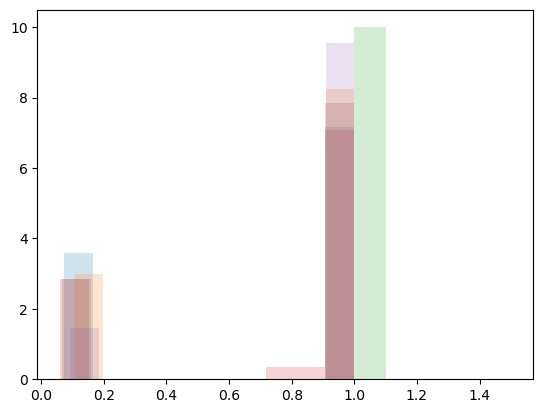

Epoch 33/2000: Training Loss = 0.278382, Validation Loss = 0.288734


0it [00:00, ?it/s]

tensor(0.8443)
0.008298944681882858 1.0639714002609253


2it [00:00,  4.86it/s]

tensor(0.8402)
0.011662403121590614 1.1481298208236694
tensor(0.8450)


3it [00:00,  5.38it/s]

0.011634359136223793 0.7867839336395264
tensor(0.8438)
0.01680768094956875 0.8328994512557983


5it [00:00,  5.79it/s]

tensor(0.8399)
0.016078317537903786 1.2254109382629395
tensor(0.8494)
0.02001291885972023 0.948350191116333


6it [00:01,  5.99it/s]


tensor(0.8497)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8403)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8424)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


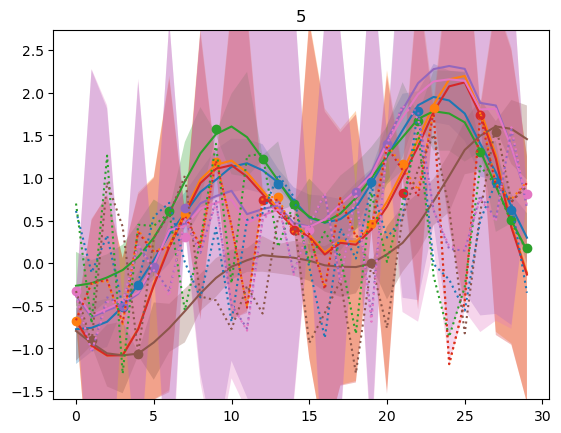

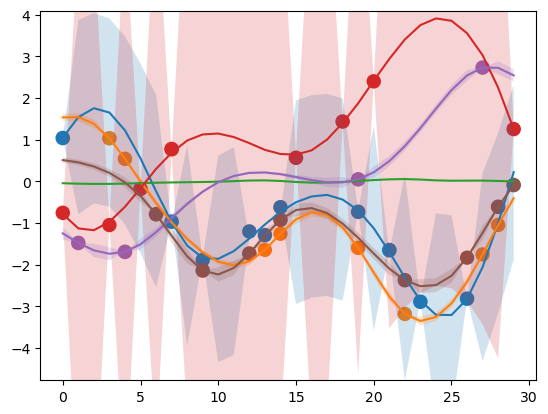

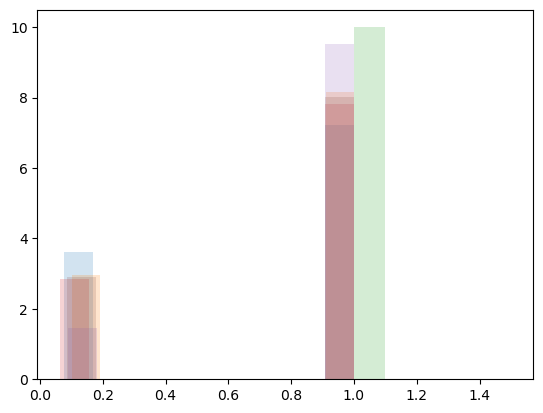

Epoch 34/2000: Training Loss = 0.285466, Validation Loss = 0.203259


1it [00:00,  5.91it/s]

tensor(0.8438)
0.014395225793123245 0.8480397462844849
tensor(0.8403)


2it [00:00,  5.91it/s]

0.008590690791606903 1.106017827987671
tensor(0.8417)
0.016957169398665428 1.3151549100875854


4it [00:00,  5.96it/s]

tensor(0.8458)
0.014780872501432896 0.9740154147148132
tensor(0.8447)


6it [00:00,  6.36it/s]

0.012165775522589684 0.8771253228187561
tensor(0.8383)
0.011734758503735065 0.9370511174201965
tensor(0.8481)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8436)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8386)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


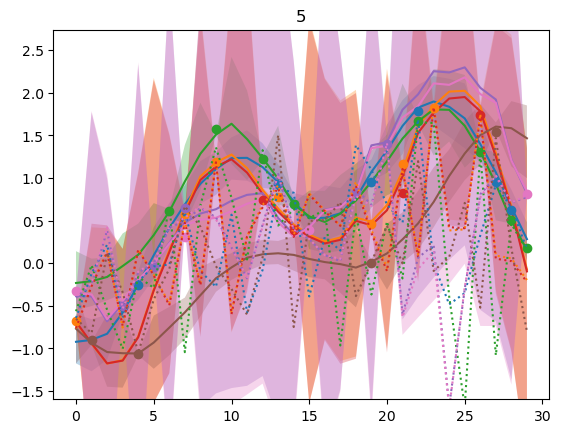

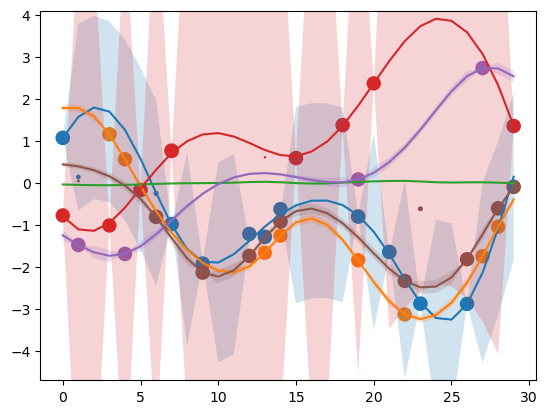

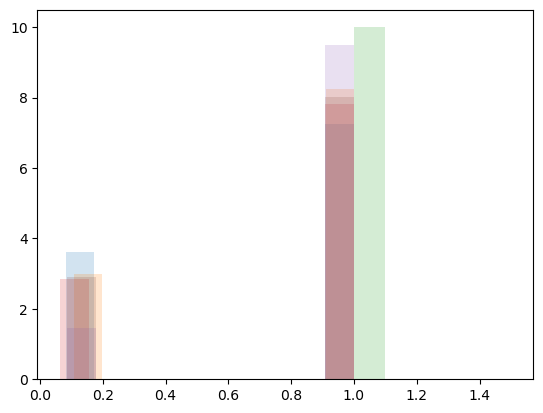

Epoch 35/2000: Training Loss = 0.286034, Validation Loss = 0.245813


1it [00:00,  5.78it/s]

tensor(0.8447)
0.009358808398246765 0.7775988578796387
tensor(0.8459)


2it [00:00,  5.82it/s]

0.010889043100178242 0.9190744757652283
tensor(0.8464)
0.008087081834673882 0.8687787055969238


4it [00:00,  5.95it/s]

tensor(0.8352)
0.016497155651450157 1.2461669445037842
tensor(0.8444)


5it [00:00,  6.00it/s]

0.02414943091571331 1.5299434661865234
tensor(0.8417)


6it [00:01,  5.82it/s]


0.010852109640836716 1.0933748483657837
tensor(0.8470)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8457)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8449)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


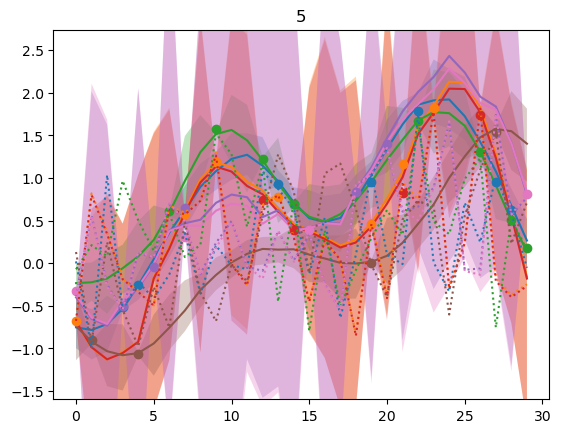

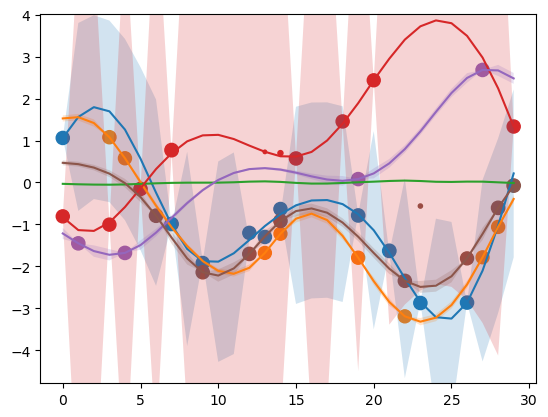

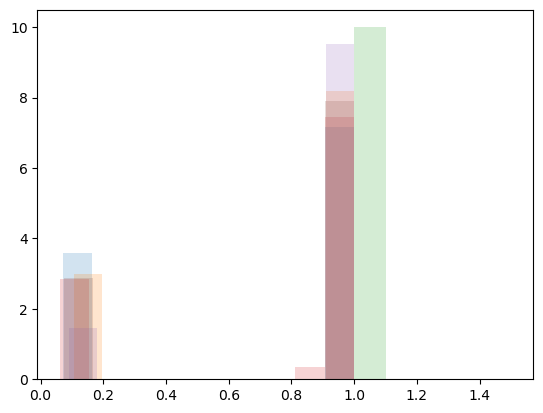

Epoch 36/2000: Training Loss = 0.297866, Validation Loss = 0.208286


1it [00:00,  6.04it/s]

tensor(0.8447)
0.0117926225066185 0.8414537310600281
tensor(0.8421)


2it [00:00,  6.12it/s]

0.007201512809842825 0.9813852906227112
tensor(0.8444)
0.009391630999743938 1.1842848062515259


4it [00:00,  6.13it/s]

tensor(0.8373)
0.01178036816418171 0.8093017935752869
tensor(0.8417)


6it [00:00,  6.70it/s]

0.011938398703932762 1.5990954637527466
tensor(0.8472)
0.021722443401813507 1.29823899269104
tensor(0.8477)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8466)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8369)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


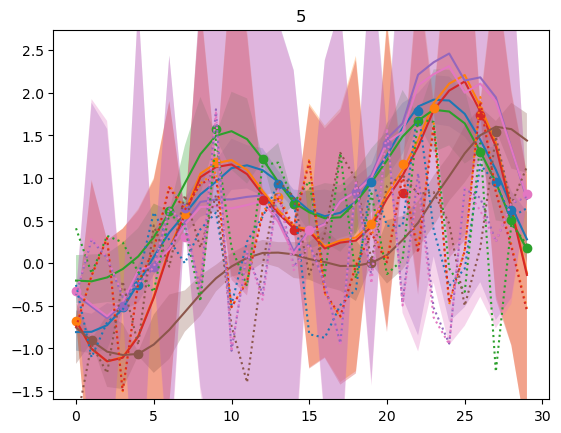

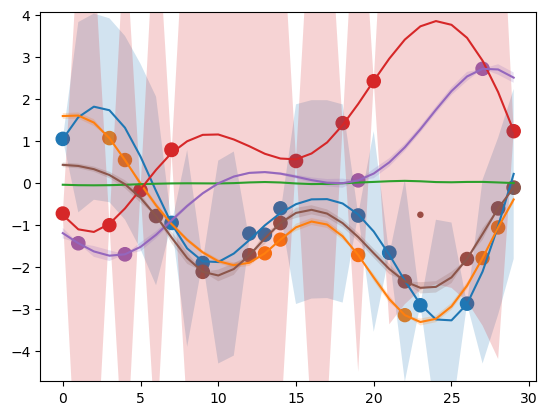

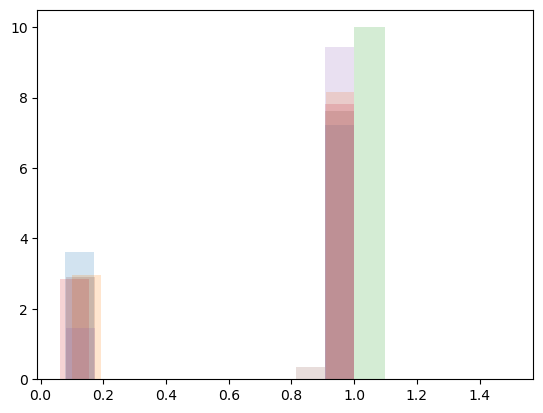

Epoch 37/2000: Training Loss = 0.306634, Validation Loss = 0.185622


1it [00:00,  6.18it/s]

tensor(0.8421)
0.011745150201022625 0.8034656047821045
tensor(0.8472)


2it [00:00,  6.14it/s]

0.009591083973646164 0.6963056325912476
tensor(0.8388)
0.011475658044219017 1.323490023612976


4it [00:00,  6.13it/s]

tensor(0.8415)
0.014916419051587582 0.9229623079299927
tensor(0.8433)


6it [00:00,  6.72it/s]

0.02015214040875435 1.0237314701080322
tensor(0.8431)
0.014080840162932873 0.7301492094993591
tensor(0.8462)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8471)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8432)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


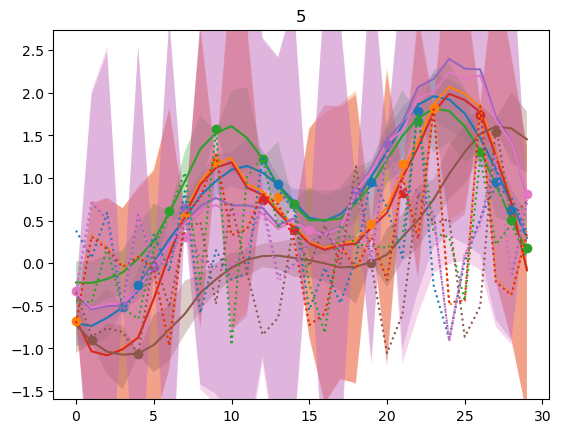

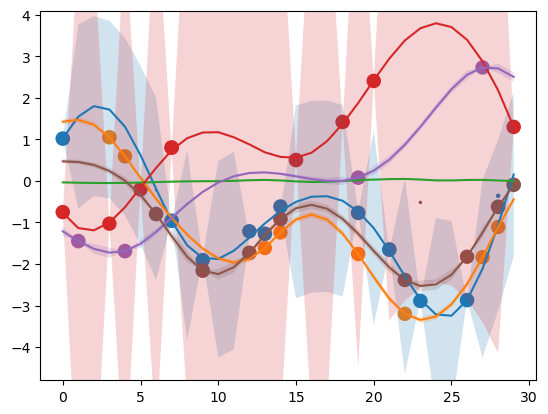

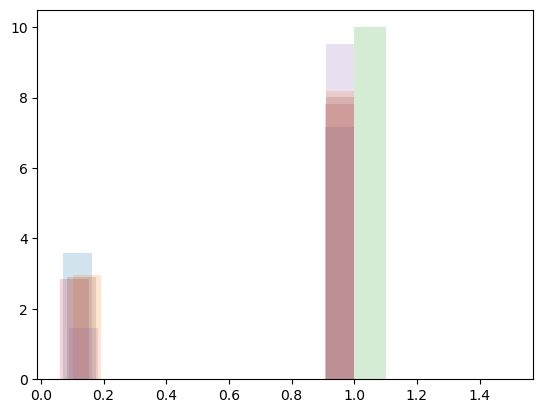

Epoch 38/2000: Training Loss = 0.266671, Validation Loss = 0.202377


1it [00:00,  6.08it/s]

tensor(0.8487)
0.014996961690485477 0.9270973205566406
tensor(0.8492)


2it [00:00,  6.08it/s]

0.01177072711288929 1.020363211631775
tensor(0.8387)
0.01030009239912033 0.8280559778213501


4it [00:00,  5.98it/s]

tensor(0.8423)
0.014864755794405937 0.90256267786026
tensor(0.8354)


6it [00:01,  5.85it/s]

0.00974329374730587 0.8099961876869202
tensor(0.8454)
0.009361892938613892 0.8173516988754272
tensor(0.8490)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8418)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8351)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7755)


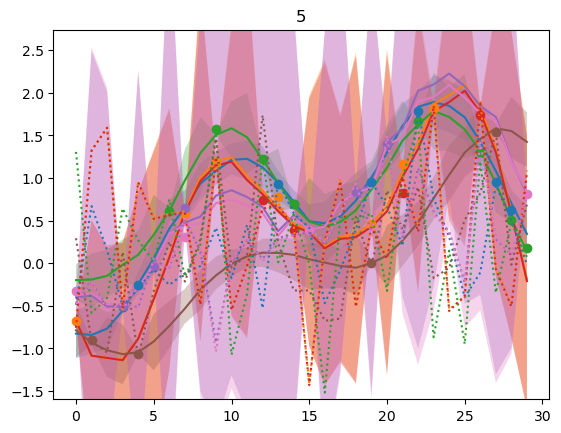

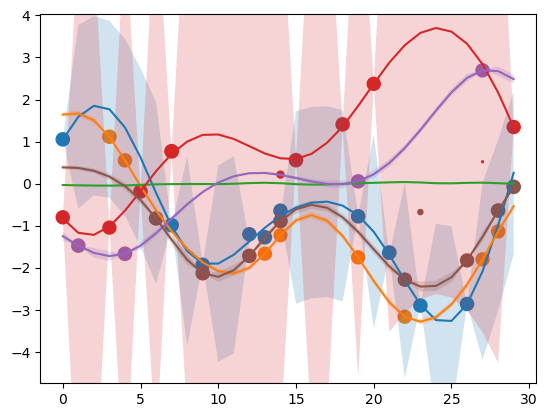

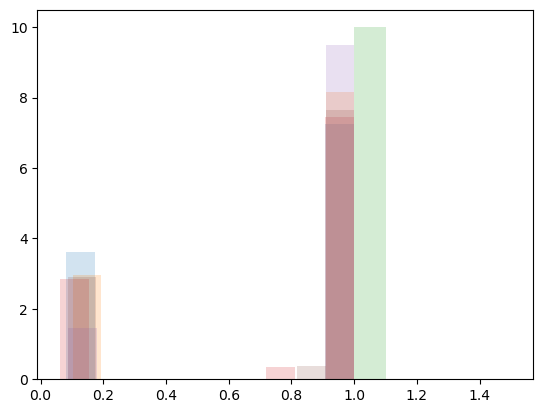

Epoch 39/2000: Training Loss = 0.257082, Validation Loss = 0.166688


1it [00:00,  5.78it/s]

tensor(0.8444)
0.013347562402486801 0.8643248081207275
tensor(0.8487)


2it [00:00,  5.91it/s]

0.005882781930267811 0.7160678505897522
tensor(0.8322)
0.009893575683236122 0.8827390074729919


4it [00:00,  6.00it/s]

tensor(0.8436)
0.013483425602316856 0.939403235912323
tensor(0.8431)


6it [00:00,  6.55it/s]

0.01765773631632328 0.9132295250892639
tensor(0.8380)
0.012525533325970173 0.8215577602386475
tensor(0.8490)


torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8439)
torch.Size([64, 30, 7]) torch.Size([64, 30, 7])
tensor(0.8427)
torch.Size([22, 30, 7]) torch.Size([22, 30, 7])
tensor(0.7758)


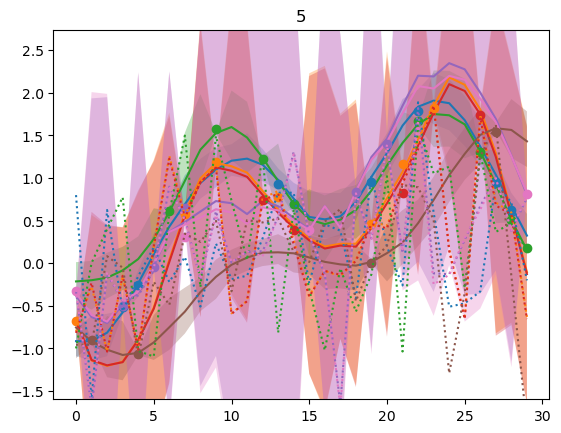

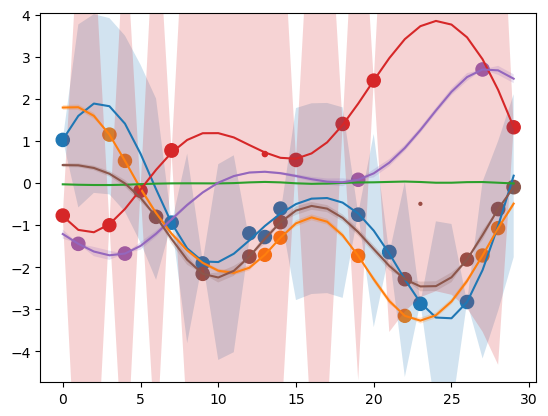

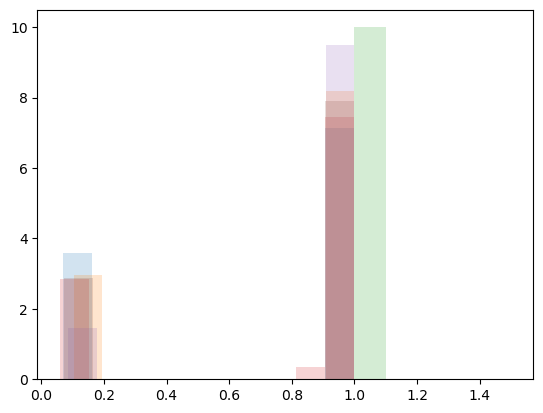

Epoch 40/2000: Training Loss = 0.251826, Validation Loss = 0.206645


1it [00:00,  6.14it/s]

tensor(0.8443)
0.013929223641753197 0.9148950576782227
tensor(0.8483)


1it [00:00,  4.29it/s]
2025-03-31 09:53:34 [WARNING]: ‼️ Training got interrupted by the user. Exist now ...
2025-03-31 09:53:34 [INFO]: Finished training. The best model is from epoch#38.


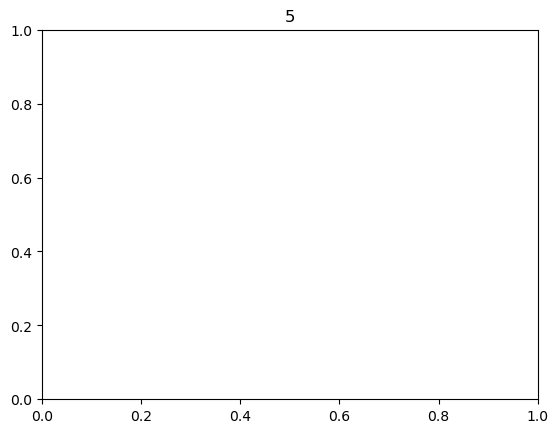

In [57]:
gpuae.model.backbone.alpha = 1e0
gpuae.model.gp.use_quantile = True
gpuae.model.gp.alpha = .8
gpuae.model.alpha = .8


gpuae.fit(dataset_train_nan, dataset_val_nan, train_kernel_only = True)  # train the model on the dataset

tensor(0.8473)
tensor(0.8439)
tensor(0.8414)


0.3552655842096746

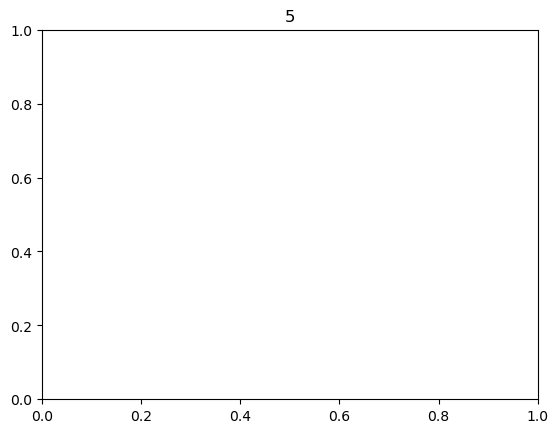

In [59]:
from pypots.utils.metrics import calc_mae
import numpy as np

results = gpuae.predict(dataset_val_nan, with_gp = True)
imputation = np.array(results['imputation'])
calc_mae(imputation, dataset_val_nan['X_ori'], (dataset_val_nan['X_ori']==dataset_val_nan['X_ori']))

In [21]:
## learn_quantiles:

X_corr = torch.tensor(dataset_train_nan['X']).float()
X_corr[X_corr!=X_corr] = 0.

qz_x_corr = gpuae.model.backbone.encoder(X_corr)
z_var = qz_x_corr.variance

gpuae.model.gp.thresholds = thresholds_gmm

tensor(0.0007)
tensor(0.0007)


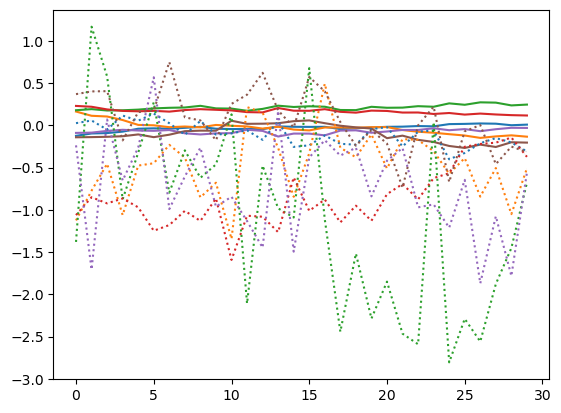

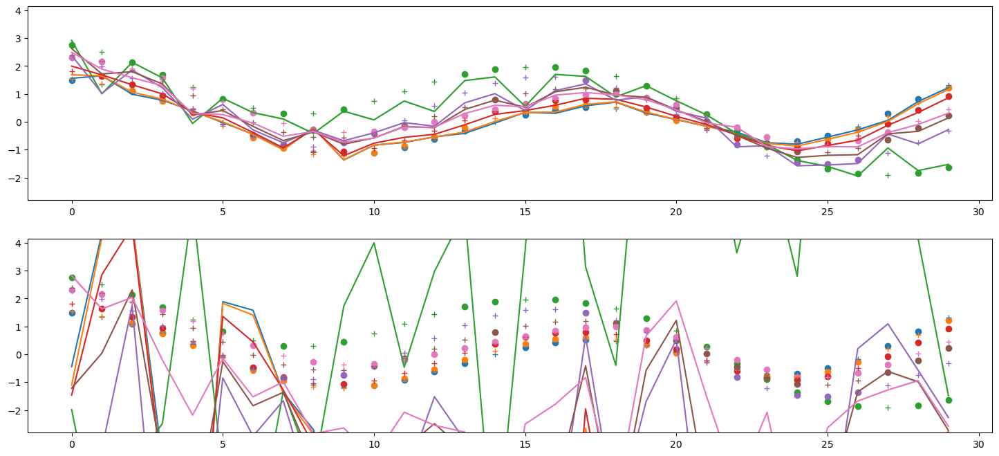

In [9]:
import numpy as np
import matplotlib.pyplot as plt

i = 3
alpha = .5

X_ori = torch.tensor(dataset_val_nan['X_ori']).float()

X_corr = torch.tensor(dataset_val_nan['X']).float()
X_corr[X_corr!=X_corr] = 0.

qz_x_corr = gpuae.model.backbone.encoder(X_corr)

# correct
kernel_params = gpuae.gp.update_kernel_params(X_corr)
qz_star = gpuae.gp.correct_qz_x_with_gp(qz_x_corr, kernel_params)

# plot reconstructions

kernel_params = gpuae.gp.update_kernel_params(X_corr)
qz_star = gpuae.gp.correct_qz_x_with_gp(qz_x_corr, kernel_params)

plot_multi_gaussian(qz_x_corr, alpha = 1)
plot_multi_gaussian(qz_star, alpha = 1, linestyle = ':')
plt.show();

fig, ax = plt.subplots(2, figsize=(18,8))

i = 4
plot_reconstructions(X_corr, X_ori, qz_star, gpuae, ax = ax[1], i = i)
plot_reconstructions(X_corr, X_ori, qz_x_corr, gpuae, ax = ax[0], i = i)


In [29]:
torch.save(gpuae.model.backbone.encoder.state_dict().copy(), 'encoder_uae')
torch.save(gpuae.model.backbone.decoder.state_dict().copy(), 'decoder_uae')

In [31]:
state_dict = torch.load('encoder_uae');
gpuae.model.backbone.encoder.load_state_dict(state_dict);
state_dict = torch.load('decoder_uae');
gpuae.model.backbone.decoder.load_state_dict(state_dict);

/var/folders/7s/75p3d4f145qfrrzfq5vskssc0000gn/T/ipykernel_94707/1864936539.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('encoder_uae');
/var/